In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import timedelta
import subprocess

import os

# 경로 설정

In [2]:
save_date = "211121"

In [3]:
## Input
path_r = "../../../../01_data/SEIR/owid-covid-data.csv"
path_vac = "../../../../01_data/SEIR/vaxx_0926_child_70.csv"
path_var = "../../../../01_data/SEIR/variants_1005_1.xlsx"

## Ground - Truth
path_2 = '../../../../01_data/국제/수집데이터_211022.xlsx'
path_3 = '../../../../01_data/국내/covid19_Nov2.csv'

## Forecast
path_sd = '../../../../03_result/SEIR/211105/seir_211105_sd.csv'  # S, D
path_i = '../../../../03_result/SEIR/211102/seir_211102_i.csv'   # TP incidence

## image
save_path = "../../../../04_image/"+save_date+"/"+save_date+"/MA/SEIR"  # 이미지 저장 폴더

In [4]:
path = pd.DataFrame({'input_1':[path_r],'input_2':[path_vac],'input_3':[path_var], 'output_1':[path_sd], 'output_2':[path_i]})
path.to_csv("../../../../00_path/SEIR/seir_path.csv")
path

,input_1,input_2,input_3,output_1,output_2
0,../../../../01_data/SEIR/owid-covid-data.csv,../../../../01_data/SEIR/vaxx_0926_child_70.csv,../../../../01_data/SEIR/variants_1005_1.xlsx,../../../../03_result/SEIR/211105/seir_211105_...,../../../../03_result/SEIR/211102/seir_211102_...


# R코드 실행

In [5]:
#####SEIR
command = '/home/sysadm/anaconda3/envs/gil/bin/Rscript'
arg = '--vanilla'
path2script = '../../../../02_code/SEIR/R/211019/r_seir_211019.R'

retcode = subprocess.call([command, arg, path2script])

# SEIR 그래프 그리기
## 1. 날짜 및 변수값 선언
#### 날짜
- file_name_date : 파일 이름에 들어갈 예측 마지막 날짜
- start_date : 이유엔 데이터의 시작날짜
- seir_start_date : seir r 코드에 들어가는 input 시작날짜
- pre_date : 예측 시작 날짜
- end_date : 예측 마지막 날짜

#### 기간
- train_date : ground-truth의 기간
- predict_date : prediction의 기간
- date : seir r 코드의 output data 총 기간(2021-11-05 기준, 2021-07-01~2023-12-31 914일)
- all_seir_date : date일 수 = 914일

In [6]:
# Date range
file_name_date = '20231231'
start_date = pd.Timestamp('2020-01-22')
seir_start_date = pd.Timestamp('2021-07-01')
pre_date = pd.Timestamp('2021-10-07') # 예측 시작날짜
end_date = pd.Timestamp('2023-12-31') ### 학습에 들어가는 예측 마지막날짜
end_date_1 = pd.Timestamp('2021-12-31')
end_date_2 = pd.Timestamp('2022-12-31')
# train_date = pd.date_range(start_date,pre_date-timedelta(days=1))
train_date = pd.date_range(start_date,pre_date)

predict_date = pd.date_range(pre_date,end_date) # 예측 날짜 범위
predict_date_1 = pd.date_range(pre_date,end_date_1)
predict_date_2 = pd.date_range(pre_date,end_date_2)

date = pd.date_range(seir_start_date,end_date)

all_seir_date = int(str(end_date-seir_start_date)[:3])+1
all_seir_date

914

In [7]:
# Option
rt = [3.5, 4, 4.5]
npi = [0.85, 1]
# npi2 = [0.85, 1]
vac = [0.8, 1, 1.2]
test = [0.95, 1, 1.2]

## 2. output 불러오기
- path_sd : SD(중증자, 사망자) result 파일
- path_i : TP-incidence(확진자) result 파일
- path_2 : ground-truth를 위한 이유엔 데이터
- path_3 : 중증자 데이터 보충을 위한 파일

In [8]:
data_case= pd.read_excel(path_2,engine = "openpyxl",sheet_name ='확진자,사망자수(US 제외)' )
data_case=data_case[data_case['Country'] =='South Korea']
data_case.drop(['Province1','Province2'], axis=1, inplace=True)
data_case

,tDate,Country,Confirmed,Deaths
38,2020-01-22,South Korea,0.0,0.0
86,2020-01-23,South Korea,0.0,0.0
130,2020-01-24,South Korea,1.0,0.0
177,2020-01-25,South Korea,0.0,0.0
225,2020-01-26,South Korea,1.0,0.0
...,...,...,...,...
369155,2021-10-08,South Korea,2172.0,10.0
369878,2021-10-09,South Korea,1949.0,6.0
370601,2021-10-10,South Korea,1594.0,15.0
371324,2021-10-11,South Korea,1297.0,8.0


### [Ground-Truth] 확진자, 사망자 
- 확진자의 경우, 크게 잘못된 값은 질병관리청을 참고하여 수정함.

In [9]:
## 과거 확진자, 사망자
old_data= data_case[ data_case['tDate'].isin(train_date) ] #Confirmed, Deaths
old_data = old_data.fillna(0)

###### 확진자 데이터 수정(질병관리청 보도자료 참고)
## 없는 데이터...
old_data.loc[old_data['tDate']=='2021-09-25','Confirmed']= 3273
old_data.loc[old_data['tDate']=='2021-10-03','Confirmed']= 2086

## 튀는 데이터...
old_data.loc[old_data['tDate']=='2021-09-26','Confirmed']= 2771
old_data.loc[old_data['tDate']=='2021-10-04','Confirmed']= 1673
old_data.reset_index(drop=True, inplace=True)
old_data

,tDate,Country,Confirmed,Deaths
0,2020-01-22,South Korea,0.0,0.0
1,2020-01-23,South Korea,0.0,0.0
2,2020-01-24,South Korea,1.0,0.0
3,2020-01-25,South Korea,0.0,0.0
4,2020-01-26,South Korea,1.0,0.0
...,...,...,...,...
610,2021-10-02,South Korea,2247.0,7.0
611,2021-10-04,South Korea,1673.0,9.0
612,2021-10-05,South Korea,1575.0,11.0
613,2021-10-06,South Korea,2027.0,12.0


In [10]:
###### 21-11-03 기준으로 필요없어짐.
## 누적사망자
old_data['Cum_Deaths']=0.0
for i in range(1,len(old_data)):
    old_data.loc[[i],['Cum_Deaths']] = float(old_data.loc[[i],['Deaths']].values)+float(old_data.loc[[i-1],['Cum_Deaths']].values)
old_data

,tDate,Country,Confirmed,Deaths,Cum_Deaths
0,2020-01-22,South Korea,0.0,0.0,0.0
1,2020-01-23,South Korea,0.0,0.0,0.0
2,2020-01-24,South Korea,1.0,0.0,0.0
3,2020-01-25,South Korea,0.0,0.0,0.0
4,2020-01-26,South Korea,1.0,0.0,0.0
...,...,...,...,...,...
610,2021-10-02,South Korea,2247.0,7.0,2510.0
611,2021-10-04,South Korea,1673.0,9.0,2519.0
612,2021-10-05,South Korea,1575.0,11.0,2530.0
613,2021-10-06,South Korea,2027.0,12.0,2542.0


### [Ground-Truth] 중증자
- 당일0시기준 위중증환자로, 이유엔 데이터는 2121-09-15 부터 있음.
- 그 이전의 데이터는 path_3에서 가져옴.

In [11]:
#일별 중증자 수 - severity
data_sev_1= pd.read_excel(path_2,engine = "openpyxl",sheet_name ='확진자 관리현황',usecols = 'A,H' )

sev_start_date = data_sev_1['tDate'][0]                # 시작 날짜(이전의 데이터를 붙이기 위해 필요)
sev_end_date = data_sev_1['tDate'][len(data_sev_1)-1]  # 끝 날짜 (이후의 데이터를 붙이기 위해 필요)

data_sev_1.rename(columns = {'tDate' : 'Date','TodayIllPatient':'Severity'}, inplace = True)
data_sev_1_2 = data_sev_1.fillna(0)
data_sev_1_2

data_sev_2 = pd.read_csv(path_3,usecols=[0,6])
data_sev_2['Date'] = pd.to_datetime(data_sev_2['Date'])
old_sev = data_sev_2.loc[data_sev_2['Date']<sev_start_date]
old_sev_1 = old_sev.fillna(0)
old_sev_1

old_severity = pd.concat([old_sev_1,data_sev_1_2])
old_severity = old_severity[old_severity['Date'].isin(train_date)]
old_severity

,Date,Severity
2,2020-01-22,0.0
3,2020-01-23,0.0
4,2020-01-24,0.0
5,2020-01-25,0.0
6,2020-01-26,0.0
...,...,...
382,2021-10-02,336.0
383,2021-10-03,346.0
384,2021-10-04,348.0
385,2021-10-05,346.0


### [Prediction] 확진자

In [12]:
tp_data = pd.read_csv(path_i)
tp_data.head(5)

,Unnamed: 0,time,U1,U2,U3,U4,V1,V2,V3,V4,...,V3.incidence,V4.incidence,V.incidence,V_cum,case,RT_,NPID,NPI,VACCINE_,TEST_
0,1,1,8.796616e+06,1.272598e+07,1.565429e+07,4.471542e+06,724.0,1257656.0,1360168.0,7290718.0,...,1000.0,4000.0,5000.0,5000.0,RT 3.5 NPID 300 NPI1 0.85 VACCINE_ 0.8 TEST_ 1,3.5,300,0.85,0.8,1
1,2,2,8.782313e+06,1.265117e+07,1.555436e+07,4.431066e+06,14589.0,1331889.0,1459458.0,7331003.0,...,99290.0,40285.0,227673.0,232673.0,RT 3.5 NPID 300 NPI1 0.85 VACCINE_ 0.8 TEST_ 1,3.5,300,0.85,0.8,1
2,3,3,8.767972e+06,1.257631e+07,1.545438e+07,4.390577e+06,28454.0,1406122.0,1558748.0,7371288.0,...,99290.0,40285.0,227673.0,460346.0,RT 3.5 NPID 300 NPI1 0.85 VACCINE_ 0.8 TEST_ 1,3.5,300,0.85,0.8,1
3,4,4,8.753600e+06,1.250141e+07,1.535436e+07,4.350081e+06,42319.0,1480355.0,1658038.0,7411573.0,...,99290.0,40285.0,227673.0,688019.0,RT 3.5 NPID 300 NPI1 0.85 VACCINE_ 0.8 TEST_ 1,3.5,300,0.85,0.8,1
4,5,5,8.739204e+06,1.242649e+07,1.525432e+07,4.309581e+06,56184.0,1554588.0,1757328.0,7451858.0,...,99290.0,40285.0,227673.0,915692.0,RT 3.5 NPID 300 NPI1 0.85 VACCINE_ 0.8 TEST_ 1,3.5,300,0.85,0.8,1


In [13]:
tp_data['TP.incidence']

0        1000.000000
1         803.673187
2         870.884447
3         917.141231
4         951.857453
            ...     
24673       0.000000
24674       0.000000
24675       0.000000
24676       0.000000
24677       0.000000
Name: TP.incidence, Length: 24678, dtype: float64

### [Prediction] 중증자, 사망자
- 사망자는 누적값으로 결과가 나오므로 신규 사망자값을 계산 (시각화 단계에서 계산)
- 중증자, 사망자의 경우 시각화 단계에서 offset을 곱해서 ground-truth에 피팅함.

In [14]:
s_d_data = pd.read_csv(path_sd)
s_d_data.head(5)

,Unnamed: 0,time,U1,U2,U3,U4,V1,V2,V3,V4,...,V3.incidence,V4.incidence,V.incidence,V_cum,case,RT_,NPID,NPI,VACCINE_,TEST_
0,1,1,8.796616e+06,1.272598e+07,1.565429e+07,4.471542e+06,724.0,1257656.0,1360168.0,7290718.0,...,1000.0,4000.0,5000.0,5000.0,RT 3.5 NPID 300 NPI1 0.85 VACCINE_ 0.8 TEST_ 1,3.5,300,0.85,0.8,1
1,2,2,8.782313e+06,1.265117e+07,1.555436e+07,4.431066e+06,14589.0,1331889.0,1459458.0,7331003.0,...,99290.0,40285.0,227673.0,232673.0,RT 3.5 NPID 300 NPI1 0.85 VACCINE_ 0.8 TEST_ 1,3.5,300,0.85,0.8,1
2,3,3,8.767972e+06,1.257631e+07,1.545438e+07,4.390577e+06,28454.0,1406122.0,1558748.0,7371288.0,...,99290.0,40285.0,227673.0,460346.0,RT 3.5 NPID 300 NPI1 0.85 VACCINE_ 0.8 TEST_ 1,3.5,300,0.85,0.8,1
3,4,4,8.753600e+06,1.250141e+07,1.535436e+07,4.350081e+06,42319.0,1480355.0,1658038.0,7411573.0,...,99290.0,40285.0,227673.0,688019.0,RT 3.5 NPID 300 NPI1 0.85 VACCINE_ 0.8 TEST_ 1,3.5,300,0.85,0.8,1
4,5,5,8.739204e+06,1.242649e+07,1.525432e+07,4.309581e+06,56184.0,1554588.0,1757328.0,7451858.0,...,99290.0,40285.0,227673.0,915692.0,RT 3.5 NPID 300 NPI1 0.85 VACCINE_ 0.8 TEST_ 1,3.5,300,0.85,0.8,1


## 3. 시각화

### 확진자 Plot 함수

In [15]:
def TP_Plot_21(y,param,file_name,option):
    offset = 3.5

    ################스타일#######################################
    fig = plt.figure(figsize=(40,15)) ## 캔버스 생성
    fig.patch.set_facecolor('#050636') 
    plt.rcParams['text.color'] = 'w'
    plt.rcParams['xtick.color'] = 'w'
    plt.rcParams['ytick.color'] = 'w'
    plt.rcParams['axes.spines.left'] = True
    plt.rcParams['axes.facecolor']='#050636'
    plt.grid(color='w', linestyle='-', linewidth=3,alpha = 0.5)
    plt.gca().spines['bottom'].set_visible(True) #위 테두리
    plt.gca().spines['left'].set_visible(True) #왼쪽 테두리
    #############################################################
   
    low_data = y[0:all_seir_date]
    low_data['tDate'] = date
    
    base_data = y[all_seir_date:all_seir_date*2]
    base_data['tDate'] = date

    high_data = y[all_seir_date*2:all_seir_date*3]
    high_data['tDate'] = date

    
    ################ Ground Truth #######################################
    plt.plot(old_data['tDate'], old_data['Confirmed'],color = '#2dcafd',  linewidth = 6)  ## 이유엔 데이터

    
    
    ################ Low Data #######################################
    plt.plot(predict_date_1, low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date_1),'TP.incidence']*offset, color ='#09d0a2', linewidth = 8)

    plt.fill_between(predict_date_1, low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date_1),'TP.incidence']*offset-300, 
                    low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date_1),'TP.incidence']*offset+300, color = '#09d0a2',alpha=0.3)
    
    
    
    ################ Base Data #######################################
    plt.plot(predict_date_1, base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date_1),'TP.incidence']*offset, color ='#f56be4', linewidth = 8)

    plt.fill_between(predict_date_1,base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date_1),'TP.incidence']*offset-300, 
                    base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date_1),'TP.incidence']*offset+300, color = '#f56be4',alpha=0.3)
    
    
    
    ################ High Data #######################################
    plt.plot(predict_date_1, high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date_1),'TP.incidence']*offset, color ='#f68960', linewidth = 8)
 
    plt.fill_between(predict_date_1, high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date_1),'TP.incidence']*offset-300, 
                    high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date_1),'TP.incidence']*offset+300, color = '#f68960',alpha=0.3)
    
    
    
    ################ Legend #######################################
    plt.legend(['Ground-Truth',param+' '+str(option[0]),param+' '+str(option[1]),param+' '+str(option[2])],fontsize=30,loc = 'upper left', edgecolor = 'w') #왜 이게 적용안되지?


    plt.axvline(x = pre_date,linestyle = ':',color='w',linewidth=8, alpha = 0.7)
    
#     plt.title(file_name,fontsize=50)
    plt.xticks([old_data.iloc[0,0],'2020-04-01','2020-06-01','2020-08-01','2020-10-01','2020-12-01','2021-02-01','2021-04-01','2021-06-01','2021-08-01',pre_date,end_date_1],[str(old_data.iloc[0,0])[:10],'2020-04','2020-06','2020-08','2020-10','2020-12','2021-02','2021-04','2021-06','2021-08',str(pre_date)[:10],str(end_date_1)[:10]],fontsize=30)
    plt.yticks(fontsize = 30)
    plt.tight_layout()
    plt.savefig(save_path+"/I/20211231"+file_name+".png",dpi=300)
    plt.show()

In [16]:
def TP_Plot_22(y,param,file_name,option):
    offset = 3.5

    ################스타일#######################################
    fig = plt.figure(figsize=(40,15)) ## 캔버스 생성
    fig.patch.set_facecolor('#050636') 
    plt.rcParams['text.color'] = 'w'
    plt.rcParams['xtick.color'] = 'w'
    plt.rcParams['ytick.color'] = 'w'
    plt.rcParams['axes.spines.left'] = True
    plt.rcParams['axes.facecolor']='#050636'
    plt.grid(color='w', linestyle='-', linewidth=3,alpha = 0.5)
    plt.gca().spines['bottom'].set_visible(True) #위 테두리
    plt.gca().spines['left'].set_visible(True) #왼쪽 테두리
    #############################################################
   
    low_data = y[0:all_seir_date]
    low_data['tDate'] = date
    
    base_data = y[all_seir_date:all_seir_date*2]
    base_data['tDate'] = date

    high_data = y[all_seir_date*2:all_seir_date*3]
    high_data['tDate'] = date

    
    ################ Ground Truth #######################################
    plt.plot(old_data['tDate'], old_data['Confirmed'],color = '#2dcafd',  linewidth = 6)  ## 이유엔 데이터

    
    
    ################ Low Data #######################################
    plt.plot(predict_date_2, low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date_2),'TP.incidence']*offset, color ='#09d0a2', linewidth = 8)

    plt.fill_between(predict_date_2, low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date_2),'TP.incidence']*offset-300, 
                    low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date_2),'TP.incidence']*offset+300, color = '#09d0a2',alpha=0.3)
    
    
    
    ################ Base Data #######################################
    plt.plot(predict_date_2, base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date_2),'TP.incidence']*offset, color ='#f56be4', linewidth = 8)

    plt.fill_between(predict_date_2,base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date_2),'TP.incidence']*offset-300, 
                    base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date_2),'TP.incidence']*offset+300, color = '#f56be4',alpha=0.3)
    
    
    
    ################ High Data #######################################
    plt.plot(predict_date_2, high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date_2),'TP.incidence']*offset, color ='#f68960', linewidth = 8)
 
    plt.fill_between(predict_date_2, high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date_2),'TP.incidence']*offset-300, 
                    high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date_2),'TP.incidence']*offset+300, color = '#f68960',alpha=0.3)
    
    
    
    ################ Legend #######################################
    plt.legend(['Ground-Truth',param+' '+str(option[0]),param+' '+str(option[1]),param+' '+str(option[2])],fontsize=30,loc = 'upper left', edgecolor = 'w') #왜 이게 적용안되지?


    plt.axvline(x = pre_date,linestyle = ':',color='w',linewidth=8, alpha = 0.7)
    
#     plt.title(file_name,fontsize=50)
    plt.xticks([old_data.iloc[0,0],'2020-05-01','2020-09-01','2020-12-01','2021-03-01','2021-06-01',pre_date,'2022-01-01','2022-04-01','2022-07-01','2022-10-01',end_date_2],[str(old_data.iloc[0,0])[:10],'2020-05','2020-09','2020-12','2021-03','2021-06',str(pre_date)[:10],'2022-01','2022-04','2022-07','2022-10',str(end_date_2)[:10]],fontsize=30)
    plt.yticks(fontsize = 30)
    plt.tight_layout()
    plt.savefig(save_path+"/I/20221231"+file_name+".png",dpi=300)
    plt.show()

In [17]:
def TP_Plot_23(y,param,file_name,option):
    offset = 3.5

    ################스타일#######################################
    fig = plt.figure(figsize=(40,15)) ## 캔버스 생성
    fig.patch.set_facecolor('#050636') 
    plt.rcParams['text.color'] = 'w'
    plt.rcParams['xtick.color'] = 'w'
    plt.rcParams['ytick.color'] = 'w'
    plt.rcParams['axes.spines.left'] = True
    plt.rcParams['axes.facecolor']='#050636'
    plt.grid(color='w', linestyle='-', linewidth=3,alpha = 0.5)
    plt.gca().spines['bottom'].set_visible(True) #위 테두리
    plt.gca().spines['left'].set_visible(True) #왼쪽 테두리
    #############################################################
   
    low_data = y[0:all_seir_date]
    low_data['tDate'] = date
    
    base_data = y[all_seir_date:all_seir_date*2]
    base_data['tDate'] = date

    high_data = y[all_seir_date*2:all_seir_date*3]
    high_data['tDate'] = date

    
    ################ Ground Truth #######################################
    plt.plot(old_data['tDate'], old_data['Confirmed'],color = '#2dcafd',  linewidth = 6)  ## 이유엔 데이터

    
    
    ################ Low Data #######################################
    plt.plot(predict_date, low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date),'TP.incidence']*offset, color ='#09d0a2', linewidth = 8)

    plt.fill_between(predict_date, low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date),'TP.incidence']*offset-300, 
                    low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date),'TP.incidence']*offset+300, color = '#09d0a2',alpha=0.3)
    
    
    
    ################ Base Data #######################################
    plt.plot(predict_date, base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date),'TP.incidence']*offset, color ='#f56be4', linewidth = 8)

    plt.fill_between(predict_date,base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date),'TP.incidence']*offset-300, 
                    base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date),'TP.incidence']*offset+300, color = '#f56be4',alpha=0.3)
    
    
    
    ################ High Data #######################################
    plt.plot(predict_date, high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date),'TP.incidence']*offset, color ='#f68960', linewidth = 8)
 
    plt.fill_between(predict_date, high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date),'TP.incidence']*offset-300, 
                    high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date),'TP.incidence']*offset+300, color = '#f68960',alpha=0.3)
    
    
    
    ################ Legend #######################################
    plt.legend(['Ground-Truth',param+' '+str(option[0]),param+' '+str(option[1]),param+' '+str(option[2])],fontsize=30,loc = 'upper left', edgecolor = 'w') #왜 이게 적용안되지?


    plt.axvline(x = pre_date,linestyle = ':',color='w',linewidth=8, alpha = 0.7)
    
#     plt.title(file_name,fontsize=50)
    plt.xticks([old_data.iloc[0,0],'2020-06-01','2020-11-01','2021-05-01',pre_date,'2022-04-01','2022-09-01','2023-03-01','2023-08-01',end_date],[str(old_data.iloc[0,0])[:10],'2020-06','2020-11','2021-05',str(pre_date)[:10],'2022-04','2022-09','2023-03','2023-08',str(end_date)[:10]],fontsize=30)
    plt.yticks(fontsize = 30)
    plt.tight_layout()
    plt.savefig(save_path+"/I/20231231"+file_name+".png",dpi=300)
    plt.show()

### 중증자 Plot 함수

In [18]:
def S_Plot_21(y,param,file_name,option):
    offset = 2.5
    ################스타일#######################################
    fig = plt.figure(figsize=(40,15)) ## 캔버스 생성
    fig.patch.set_facecolor('#050636') 
    plt.rcParams['text.color'] = 'w'
    plt.rcParams['xtick.color'] = 'w'
    plt.rcParams['ytick.color'] = 'w'
    plt.rcParams['axes.spines.left'] = True
    plt.rcParams['axes.facecolor']='#050636'
    plt.grid(color='w', linestyle='-', linewidth=3,alpha = 0.5)
    plt.gca().spines['bottom'].set_visible(True) #위 테두리
    plt.gca().spines['left'].set_visible(True) #왼쪽 테두리
    #############################################################
   
    low_data = y[0:all_seir_date]
    low_data['tDate'] = date
    
    base_data = y[all_seir_date:all_seir_date*2]
    base_data['tDate'] = date

    high_data = y[all_seir_date*2:all_seir_date*3]
    high_data['tDate'] = date


    ################ Ground Truth #######################################
    plt.plot(old_severity['Date'], old_severity['Severity'],color = '#2dcafd', linewidth = 6)

    
    
    ################ Low Data #######################################
    plt.plot(predict_date_1, low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date_1),'S']*offset, color ='#09d0a2', linewidth = 8)

    plt.fill_between(predict_date_1, low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date_1),'S']*offset-50, 
                    low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date_1),'S']*offset+50, color = '#09d0a2',alpha=0.3)
    
    
    
    ################ Base Data #######################################
    plt.plot(predict_date_1, base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date_1),'S']*offset, color ='#f56be4', linewidth = 8)

    plt.fill_between(predict_date_1,base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date_1),'S']*offset-50, 
                    base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date_1),'S']*offset+50, color = '#f56be4',alpha=0.3)
    

    
    ################ High Data #######################################
    plt.plot(predict_date_1, high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date_1),'S']*offset, color ='#f68960', linewidth = 8)
 
    plt.fill_between(predict_date_1, high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date_1),'S']*offset-50, 
                    high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date_1),'S']*offset+50, color = '#f68960',alpha=0.3)
    
    
    
    ################ Legend #######################################
    plt.legend(['Ground-Truth',param+' '+str(option[0]),param+' '+str(option[1]),param+' '+str(option[2])],fontsize=30,loc = 'upper left', edgecolor = 'w') #왜 이게 적용안되지?


    plt.axvline(x = pre_date,linestyle = ':',color='w',linewidth=8, alpha = 0.7)
    
#     plt.title(file_name,fontsize=50)
    plt.xticks([old_severity.iloc[0,0],'2020-04-01','2020-06-01','2020-08-01','2020-10-01','2020-12-01','2021-02-01','2021-04-01','2021-06-01','2021-08-01',pre_date,end_date_1],[str(old_severity.iloc[0,0])[:10],'2020-04','2020-06','2020-08','2020-10','2020-12','2021-02','2021-04','2021-06','2021-08',str(pre_date)[:10],str(end_date_1)[:10]],fontsize=30)
    
    plt.yticks(fontsize = 30)
    plt.tight_layout()
    plt.savefig(save_path+"/S/20211231"+file_name+".png",dpi=300)
    plt.show()

In [19]:
def S_Plot_22(y,param,file_name,option):
    offset = 2.5
    ################스타일#######################################
    fig = plt.figure(figsize=(40,15)) ## 캔버스 생성
    fig.patch.set_facecolor('#050636') 
    plt.rcParams['text.color'] = 'w'
    plt.rcParams['xtick.color'] = 'w'
    plt.rcParams['ytick.color'] = 'w'
    plt.rcParams['axes.spines.left'] = True
    plt.rcParams['axes.facecolor']='#050636'
    plt.grid(color='w', linestyle='-', linewidth=3,alpha = 0.5)
    plt.gca().spines['bottom'].set_visible(True) #위 테두리
    plt.gca().spines['left'].set_visible(True) #왼쪽 테두리
    #############################################################
   
    low_data = y[0:all_seir_date]
    low_data['tDate'] = date
    
    base_data = y[all_seir_date:all_seir_date*2]
    base_data['tDate'] = date

    high_data = y[all_seir_date*2:all_seir_date*3]
    high_data['tDate'] = date


    ################ Ground Truth #######################################
    plt.plot(old_severity['Date'], old_severity['Severity'],color = '#2dcafd', linewidth = 6)

    
    
    ################ Low Data #######################################
    plt.plot(predict_date_2, low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date_2),'S']*offset, color ='#09d0a2', linewidth = 8)

    plt.fill_between(predict_date_2, low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date_2),'S']*offset-50, 
                    low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date_2),'S']*offset+50, color = '#09d0a2',alpha=0.3)
    
    
    
    ################ Base Data #######################################
    plt.plot(predict_date_2, base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date_2),'S']*offset, color ='#f56be4', linewidth = 8)

    plt.fill_between(predict_date_2,base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date_2),'S']*offset-50, 
                    base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date_2),'S']*offset+50, color = '#f56be4',alpha=0.3)
    

    
    ################ High Data #######################################
    plt.plot(predict_date_2, high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date_2),'S']*offset, color ='#f68960', linewidth = 8)
 
    plt.fill_between(predict_date_2, high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date_2),'S']*offset-50, 
                    high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date_2),'S']*offset+50, color = '#f68960',alpha=0.3)
    
    
    
    ################ Legend #######################################
    plt.legend(['Ground-Truth',param+' '+str(option[0]),param+' '+str(option[1]),param+' '+str(option[2])],fontsize=30,loc = 'upper left', edgecolor = 'w') #왜 이게 적용안되지?


    plt.axvline(x = pre_date,linestyle = ':',color='w',linewidth=8, alpha = 0.7)
    
#     plt.title(file_name,fontsize=50)
    plt.xticks([old_severity.iloc[0,0],'2020-05-01','2020-09-01','2020-12-01','2021-03-01','2021-06-01',pre_date,'2022-01-01','2022-04-01','2022-07-01','2022-10-01',end_date_2],[str(old_severity.iloc[0,0])[:10],'2020-05','2020-09','2020-12','2021-03','2021-06',str(pre_date)[:10],'2022-01','2022-04','2022-07','2022-10',str(end_date_2)[:10]],fontsize=30)

    plt.yticks(fontsize = 30)
    plt.tight_layout()
    plt.savefig(save_path+"/S/20221231"+file_name+".png",dpi=300)
    plt.show()

In [20]:
def S_Plot_23(y,param,file_name,option):
    offset = 2.5
    ################스타일#######################################
    fig = plt.figure(figsize=(40,15)) ## 캔버스 생성
    fig.patch.set_facecolor('#050636') 
    plt.rcParams['text.color'] = 'w'
    plt.rcParams['xtick.color'] = 'w'
    plt.rcParams['ytick.color'] = 'w'
    plt.rcParams['axes.spines.left'] = True
    plt.rcParams['axes.facecolor']='#050636'
    plt.grid(color='w', linestyle='-', linewidth=3,alpha = 0.5)
    plt.gca().spines['bottom'].set_visible(True) #위 테두리
    plt.gca().spines['left'].set_visible(True) #왼쪽 테두리
    #############################################################
   
    low_data = y[0:all_seir_date]
    low_data['tDate'] = date
    
    base_data = y[all_seir_date:all_seir_date*2]
    base_data['tDate'] = date

    high_data = y[all_seir_date*2:all_seir_date*3]
    high_data['tDate'] = date


    ################ Ground Truth #######################################
    plt.plot(old_severity['Date'], old_severity['Severity'],color = '#2dcafd', linewidth = 6)

    
    
    ################ Low Data #######################################
    plt.plot(predict_date, low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date),'S']*offset, color ='#09d0a2', linewidth = 8)

    plt.fill_between(predict_date, low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date),'S']*offset-50, 
                    low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date),'S']*offset+50, color = '#09d0a2',alpha=0.3)
    
    
    
    ################ Base Data #######################################
    plt.plot(predict_date, base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date),'S']*offset, color ='#f56be4', linewidth = 8)

    plt.fill_between(predict_date,base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date),'S']*offset-50, 
                    base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date),'S']*offset+50, color = '#f56be4',alpha=0.3)
    

    
    ################ High Data #######################################
    plt.plot(predict_date, high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date),'S']*offset, color ='#f68960', linewidth = 8)
 
    plt.fill_between(predict_date, high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date),'S']*offset-50, 
                    high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date),'S']*offset+50, color = '#f68960',alpha=0.3)
    
    
    
    ################ Legend #######################################
    plt.legend(['Ground-Truth',param+' '+str(option[0]),param+' '+str(option[1]),param+' '+str(option[2])],fontsize=30,loc = 'upper left', edgecolor = 'w') #왜 이게 적용안되지?


    plt.axvline(x = pre_date,linestyle = ':',color='w',linewidth=8, alpha = 0.7)
    
#     plt.title(file_name,fontsize=50)
    plt.xticks([old_severity.iloc[0,0],'2020-06-01','2020-11-01','2021-05-01',pre_date,'2022-04-01','2022-09-01','2023-03-01','2023-08-01',end_date],[str(old_severity.iloc[0,0])[:10],'2020-06','2020-11','2021-05',str(pre_date)[:10],'2022-04','2022-09','2023-03','2023-08',str(end_date)[:10]],fontsize=30)
    plt.yticks(fontsize = 30)
    plt.tight_layout()
    plt.savefig(save_path+"/S/20231231"+file_name+".png",dpi=300)
    plt.show()

### 사망자 Plot 함수

In [21]:
def D_Plot_21(y,param,file_name,option):
    offset = 20
    ################스타일#######################################
    fig = plt.figure(figsize=(40,15)) ## 캔버스 생성
    fig.patch.set_facecolor('#050636') 
    plt.rcParams['text.color'] = 'w'
    plt.rcParams['xtick.color'] = 'w'
    plt.rcParams['ytick.color'] = 'w'
    plt.rcParams['axes.spines.left'] = True
    plt.rcParams['axes.facecolor']='#050636'
    plt.grid(color='w', linestyle='-', linewidth=3,alpha = 0.5)
    plt.gca().spines['bottom'].set_visible(True) #위 테두리
    plt.gca().spines['left'].set_visible(True) #왼쪽 테두리
    #############################################################
   
    low_data = y[0:all_seir_date]
    low_data['tDate'] = date
    low_data.reset_index(drop=True, inplace=True)
    ### low_data 신규 사망자
    low_data['Deaths']=0.0
    for i in range(1,len(low_data)):
        low_data.loc[[i],['Deaths']] = float(low_data.loc[[i],['D']].values)-float(low_data.loc[[i-1],['D']].values)
    
    
    base_data = y[all_seir_date:all_seir_date*2]
    base_data['tDate'] = date
    base_data.reset_index(drop=True, inplace=True)
    ### base_data 신규 사망자
    base_data['Deaths']=0.0
    for i in range(1,len(base_data)):
        base_data.loc[[i],['Deaths']] = float(base_data.loc[[i],['D']].values)-float(base_data.loc[[i-1],['D']].values)

    high_data = y[all_seir_date*2:all_seir_date*3]
    high_data['tDate'] = date
    high_data.reset_index(drop=True, inplace=True)
    ### high_data 신규 사망자
    high_data['Deaths']=0.0
    for i in range(1,len(high_data)):
        high_data.loc[[i],['Deaths']] = float(high_data.loc[[i],['D']].values)-float(high_data.loc[[i-1],['D']].values)


    ################ Ground Truth #######################################
    plt.plot(old_data['tDate'], old_data['Deaths'],color = '#2dcafd', linewidth = 6)

    
    
    ################ Low Data #######################################
    plt.plot(predict_date_1, low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date_1),'Deaths']*offset, color ='#09d0a2', linewidth = 8)

    plt.fill_between(predict_date_1, low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date_1),'Deaths']*offset-3, 
                    low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date_1),'Deaths']*offset+3, color = '#09d0a2',alpha=0.3)
    
    
    
    ################ Base Data #######################################
    plt.plot(predict_date_1, base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date_1),'Deaths']*offset, color ='#f56be4', linewidth = 8)

    plt.fill_between(predict_date_1,base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date_1),'Deaths']*offset-3, 
                    base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date_1),'Deaths']*offset+3, color = '#f56be4',alpha=0.3)
    
    
    
    ################ High Data #######################################
    plt.plot(predict_date_1, high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date_1),'Deaths']*offset, color ='#f68960', linewidth = 8)
 
    plt.fill_between(predict_date_1, high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date_1),'Deaths']*offset-3, 
                    high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date_1),'Deaths']*offset+3, color = '#f68960',alpha=0.3)
    
    
    
    
    
    ################ Legend #######################################
    plt.legend(['Ground-Truth',param+' '+str(option[0]),param+' '+str(option[1]),param+' '+str(option[2])],fontsize=30,loc = 'upper left', edgecolor = 'w') #왜 이게 적용안되지?


    plt.axvline(x = pre_date,linestyle = ':',color='w',linewidth=8, alpha = 0.7)
    
#     plt.title(file_name,fontsize=50)
    plt.xticks([old_data.iloc[0,0],'2020-04-01','2020-06-01','2020-08-01','2020-10-01','2020-12-01','2021-02-01','2021-04-01','2021-06-01','2021-08-01',pre_date,end_date_1],[str(old_data.iloc[0,0])[:10],'2020-04','2020-06','2020-08','2020-10','2020-12','2021-02','2021-04','2021-06','2021-08',str(pre_date)[:10],str(end_date_1)[:10]],fontsize=30)

    plt.yticks(fontsize = 30)
    plt.tight_layout()
    plt.savefig(save_path+"/D/20211231"+file_name+".png",dpi=300)
    plt.show()

In [22]:
def D_Plot_22(y,param,file_name,option):
    offset = 20
    ################스타일#######################################
    fig = plt.figure(figsize=(40,15)) ## 캔버스 생성
    fig.patch.set_facecolor('#050636') 
    plt.rcParams['text.color'] = 'w'
    plt.rcParams['xtick.color'] = 'w'
    plt.rcParams['ytick.color'] = 'w'
    plt.rcParams['axes.spines.left'] = True
    plt.rcParams['axes.facecolor']='#050636'
    plt.grid(color='w', linestyle='-', linewidth=3,alpha = 0.5)
    plt.gca().spines['bottom'].set_visible(True) #위 테두리
    plt.gca().spines['left'].set_visible(True) #왼쪽 테두리
    #############################################################
   
    low_data = y[0:all_seir_date]
    low_data['tDate'] = date
    low_data.reset_index(drop=True, inplace=True)
    ### low_data 신규 사망자
    low_data['Deaths']=0.0
    for i in range(1,len(low_data)):
        low_data.loc[[i],['Deaths']] = float(low_data.loc[[i],['D']].values)-float(low_data.loc[[i-1],['D']].values)
    
    
    base_data = y[all_seir_date:all_seir_date*2]
    base_data['tDate'] = date
    base_data.reset_index(drop=True, inplace=True)
    ### base_data 신규 사망자
    base_data['Deaths']=0.0
    for i in range(1,len(base_data)):
        base_data.loc[[i],['Deaths']] = float(base_data.loc[[i],['D']].values)-float(base_data.loc[[i-1],['D']].values)

    high_data = y[all_seir_date*2:all_seir_date*3]
    high_data['tDate'] = date
    high_data.reset_index(drop=True, inplace=True)
    ### high_data 신규 사망자
    high_data['Deaths']=0.0
    for i in range(1,len(high_data)):
        high_data.loc[[i],['Deaths']] = float(high_data.loc[[i],['D']].values)-float(high_data.loc[[i-1],['D']].values)


    ################ Ground Truth #######################################
    plt.plot(old_data['tDate'], old_data['Deaths'],color = '#2dcafd', linewidth = 6)

    
    
    ################ Low Data #######################################
    plt.plot(predict_date_2, low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date_2),'Deaths']*offset, color ='#09d0a2', linewidth = 8)

    plt.fill_between(predict_date_2, low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date_2),'Deaths']*offset-3, 
                    low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date_2),'Deaths']*offset+3, color = '#09d0a2',alpha=0.3)
    
    
    
    ################ Base Data #######################################
    plt.plot(predict_date_2, base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date_2),'Deaths']*offset, color ='#f56be4', linewidth = 8)

    plt.fill_between(predict_date_2,base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date_2),'Deaths']*offset-3, 
                    base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date_2),'Deaths']*offset+3, color = '#f56be4',alpha=0.3)
    
    
    
    ################ High Data #######################################
    plt.plot(predict_date_2, high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date_2),'Deaths']*offset, color ='#f68960', linewidth = 8)
 
    plt.fill_between(predict_date_2, high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date_2),'Deaths']*offset-3, 
                    high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date_2),'Deaths']*offset+3, color = '#f68960',alpha=0.3)
    
    
    
    
    
    ################ Legend #######################################
    plt.legend(['Ground-Truth',param+' '+str(option[0]),param+' '+str(option[1]),param+' '+str(option[2])],fontsize=30,loc = 'upper left', edgecolor = 'w') #왜 이게 적용안되지?


    plt.axvline(x = pre_date,linestyle = ':',color='w',linewidth=8, alpha = 0.7)
    
#     plt.title(file_name,fontsize=50)
    plt.xticks([old_data.iloc[0,0],'2020-05-01','2020-09-01','2020-12-01','2021-03-01','2021-06-01',pre_date,'2022-01-01','2022-04-01','2022-07-01','2022-10-01',end_date_2],[str(old_data.iloc[0,0])[:10],'2020-05','2020-09','2020-12','2021-03','2021-06',str(pre_date)[:10],'2022-01','2022-04','2022-07','2022-10',str(end_date_2)[:10]],fontsize=30)
    plt.yticks(fontsize = 30)
    plt.tight_layout()
    plt.savefig(save_path+"/D/20221231"+file_name+".png",dpi=300)
    plt.show()

In [23]:
def D_Plot_23(y,param,file_name,option):
    offset = 20
    ################스타일#######################################
    fig = plt.figure(figsize=(40,15)) ## 캔버스 생성
    fig.patch.set_facecolor('#050636') 
    plt.rcParams['text.color'] = 'w'
    plt.rcParams['xtick.color'] = 'w'
    plt.rcParams['ytick.color'] = 'w'
    plt.rcParams['axes.spines.left'] = True
    plt.rcParams['axes.facecolor']='#050636'
    plt.grid(color='w', linestyle='-', linewidth=3,alpha = 0.5)
    plt.gca().spines['bottom'].set_visible(True) #위 테두리
    plt.gca().spines['left'].set_visible(True) #왼쪽 테두리
    #############################################################
   
    low_data = y[0:all_seir_date]
    low_data['tDate'] = date
    low_data.reset_index(drop=True, inplace=True)
    ### low_data 신규 사망자
    low_data['Deaths']=0.0
    for i in range(1,len(low_data)):
        low_data.loc[[i],['Deaths']] = float(low_data.loc[[i],['D']].values)-float(low_data.loc[[i-1],['D']].values)
    
    
    base_data = y[all_seir_date:all_seir_date*2]
    base_data['tDate'] = date
    base_data.reset_index(drop=True, inplace=True)
    ### base_data 신규 사망자
    base_data['Deaths']=0.0
    for i in range(1,len(base_data)):
        base_data.loc[[i],['Deaths']] = float(base_data.loc[[i],['D']].values)-float(base_data.loc[[i-1],['D']].values)

    high_data = y[all_seir_date*2:all_seir_date*3]
    high_data['tDate'] = date
    high_data.reset_index(drop=True, inplace=True)
    ### high_data 신규 사망자
    high_data['Deaths']=0.0
    for i in range(1,len(high_data)):
        high_data.loc[[i],['Deaths']] = float(high_data.loc[[i],['D']].values)-float(high_data.loc[[i-1],['D']].values)


    ################ Ground Truth #######################################
    plt.plot(old_data['tDate'], old_data['Deaths'],color = '#2dcafd', linewidth = 6)

    
    
    ################ Low Data #######################################
    plt.plot(predict_date, low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date),'Deaths']*offset, color ='#09d0a2', linewidth = 8)

    plt.fill_between(predict_date, low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date),'Deaths']*offset-3, 
                    low_data.loc[(low_data['tDate']>=pre_date)&(low_data['tDate']<=end_date),'Deaths']*offset+3, color = '#09d0a2',alpha=0.3)
    
    
    
    ################ Base Data #######################################
    plt.plot(predict_date, base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date),'Deaths']*offset, color ='#f56be4', linewidth = 8)

    plt.fill_between(predict_date,base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date),'Deaths']*offset-3, 
                    base_data.loc[(base_data['tDate']>=pre_date)&(base_data['tDate']<=end_date),'Deaths']*offset+3, color = '#f56be4',alpha=0.3)
    
    
    
    ################ High Data #######################################
    plt.plot(predict_date, high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date),'Deaths']*offset, color ='#f68960', linewidth = 8)
 
    plt.fill_between(predict_date, high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date),'Deaths']*offset-3, 
                    high_data.loc[(high_data['tDate']>=pre_date)&(high_data['tDate']<=end_date),'Deaths']*offset+3, color = '#f68960',alpha=0.3)
    
    
    
    
    
    ################ Legend #######################################
    plt.legend(['Ground-Truth',param+' '+str(option[0]),param+' '+str(option[1]),param+' '+str(option[2])],fontsize=30,loc = 'upper left', edgecolor = 'w') #왜 이게 적용안되지?


    plt.axvline(x = pre_date,linestyle = ':',color='w',linewidth=8, alpha = 0.7)
    
#     plt.title(file_name,fontsize=50)
    plt.xticks([old_data.iloc[0,0],'2020-06-01','2020-11-01','2021-05-01',pre_date,'2022-04-01','2022-09-01','2023-03-01','2023-08-01',end_date],[str(old_data.iloc[0,0])[:10],'2020-06','2020-11','2021-05',str(pre_date)[:10],'2022-04','2022-09','2023-03','2023-08',str(end_date)[:10]],fontsize=30)
    plt.yticks(fontsize = 30)
    plt.tight_layout()
    plt.savefig(save_path+"/D/20231231"+file_name+".png",dpi=300)
    plt.show()

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

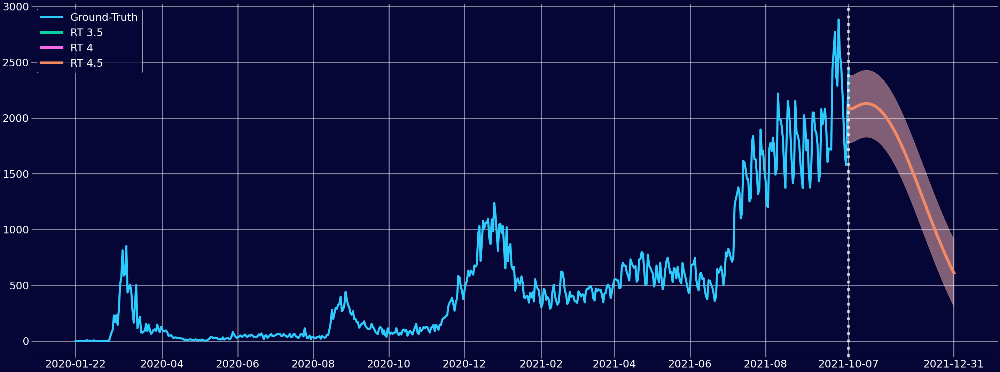

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

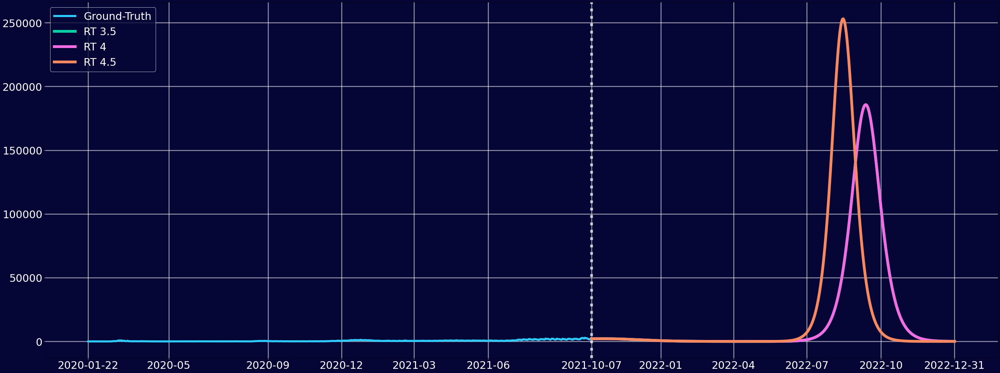

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

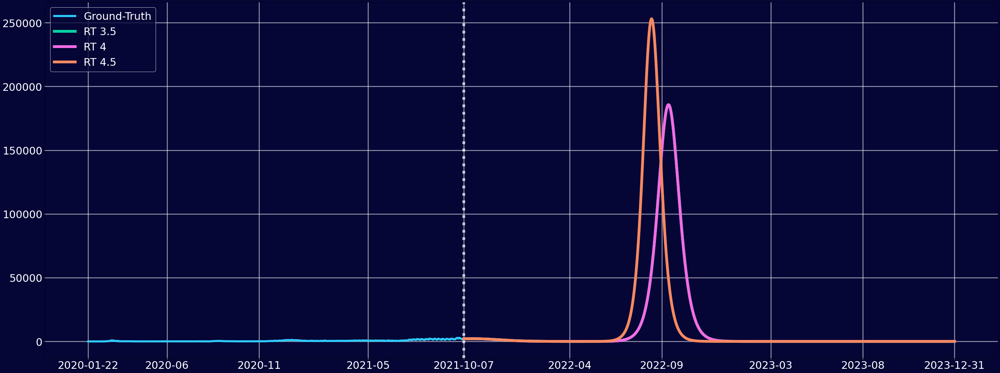

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

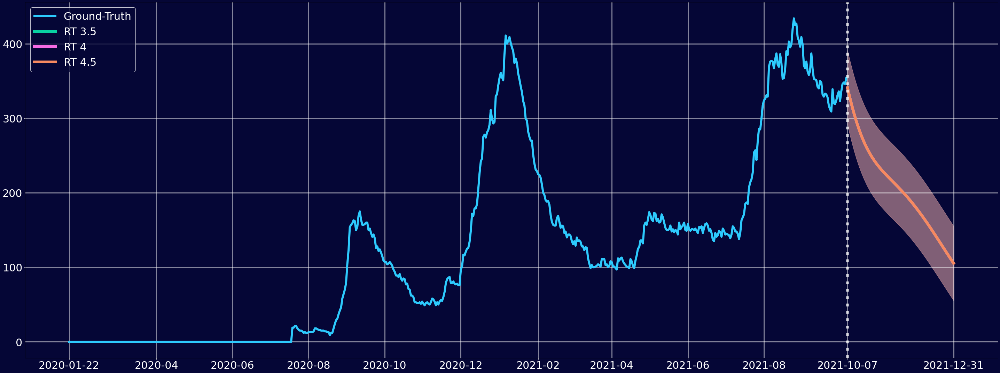

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

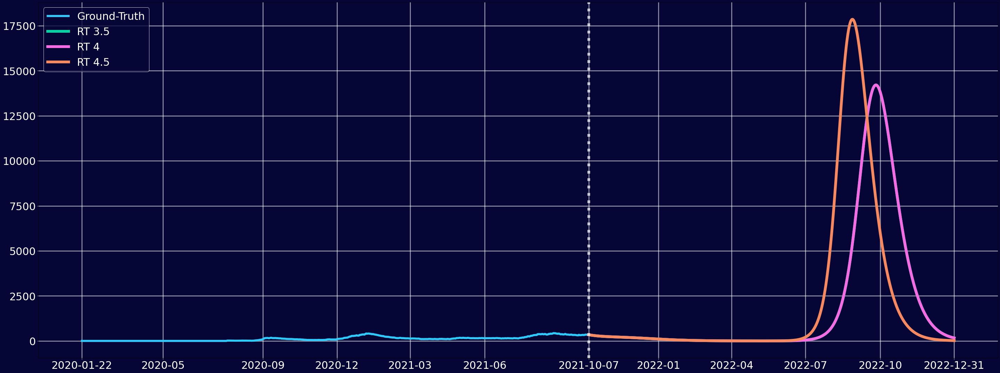

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

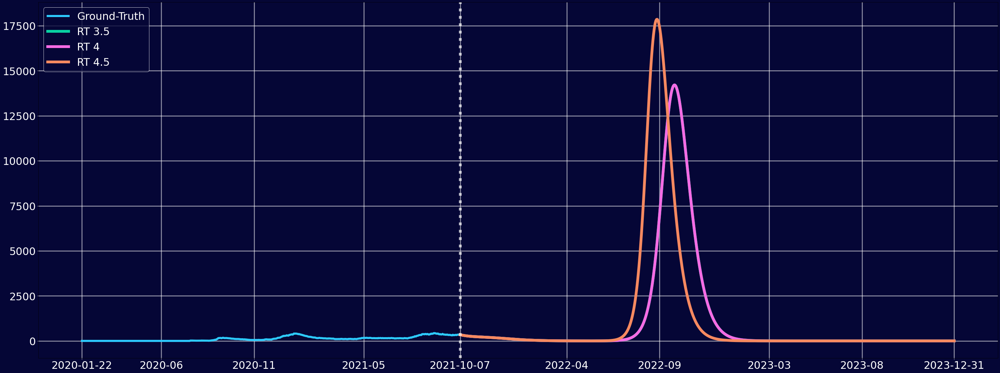

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/anaconda3/envs/heytrt3.7/lib/python3.6/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

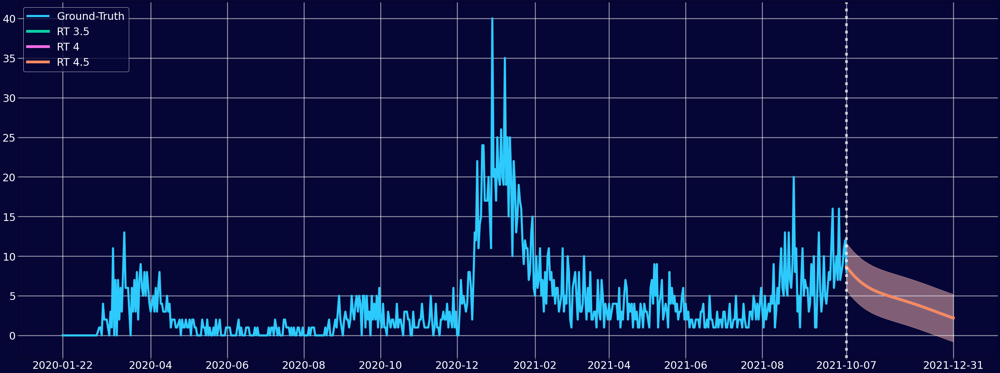

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/anaconda3/envs/heytrt3.7/lib/python3.6/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

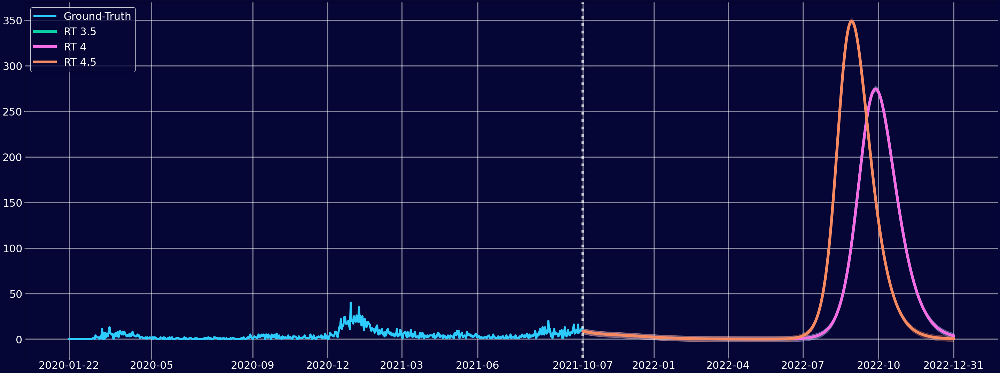

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/anaconda3/envs/heytrt3.7/lib/python3.6/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

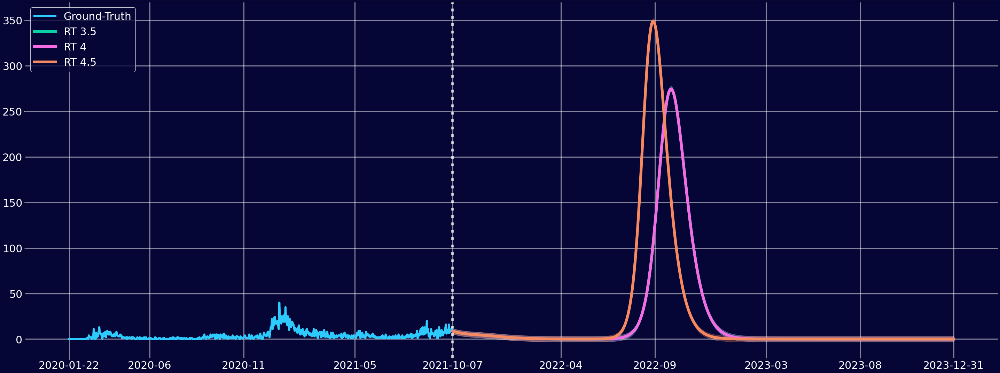

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

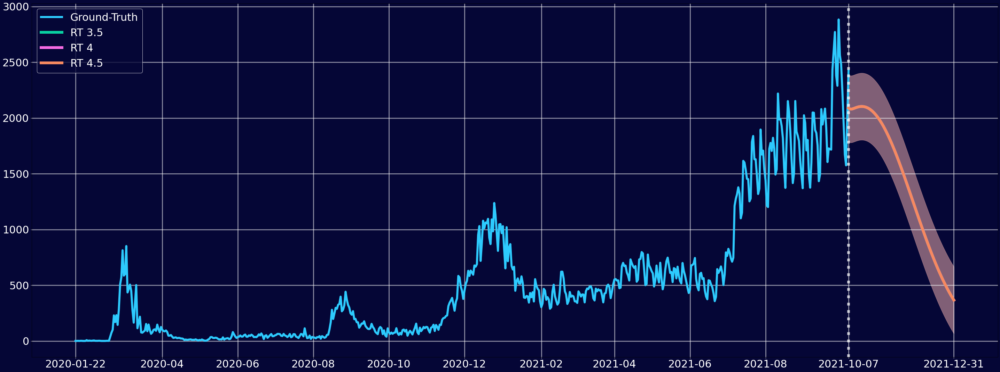

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

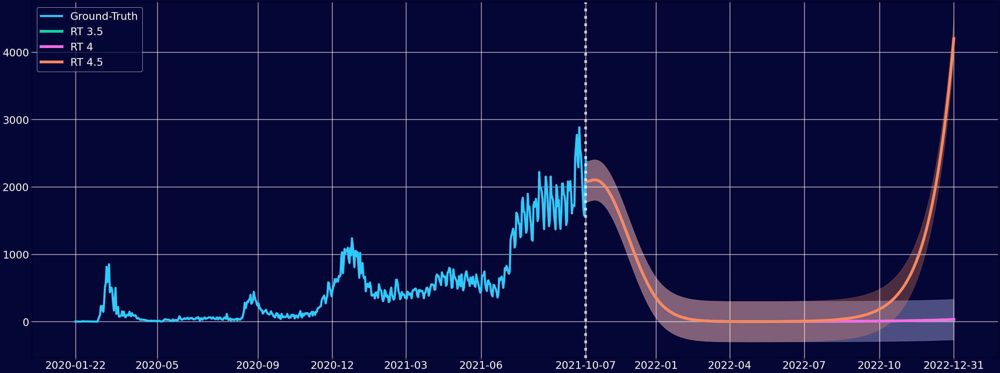

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

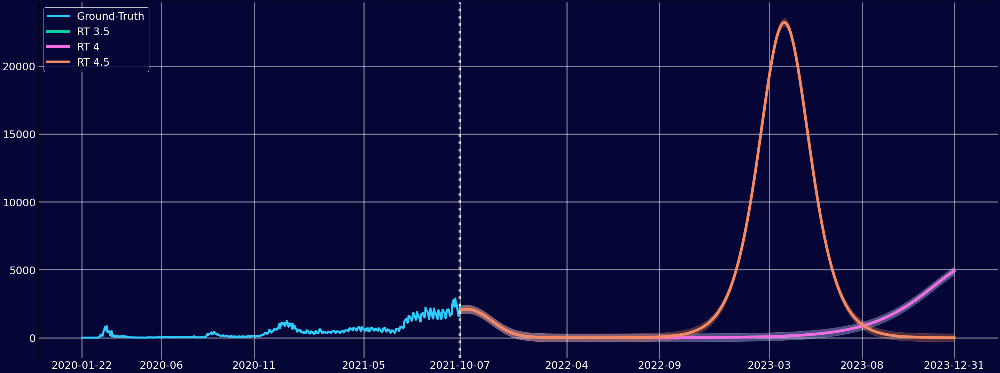

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

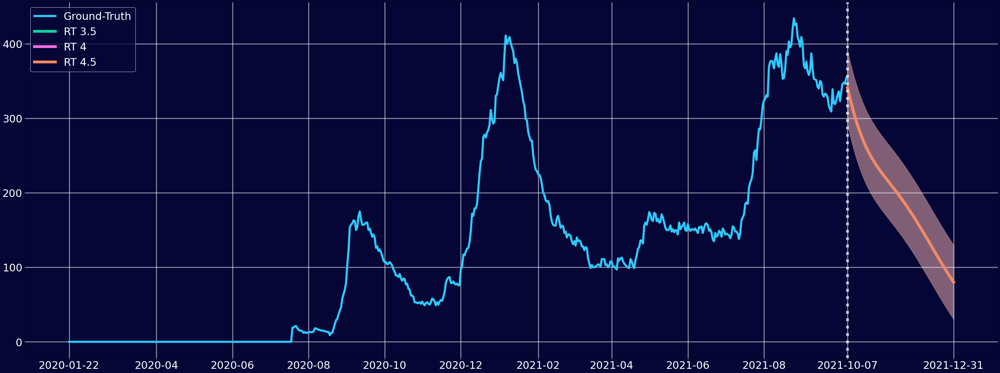

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

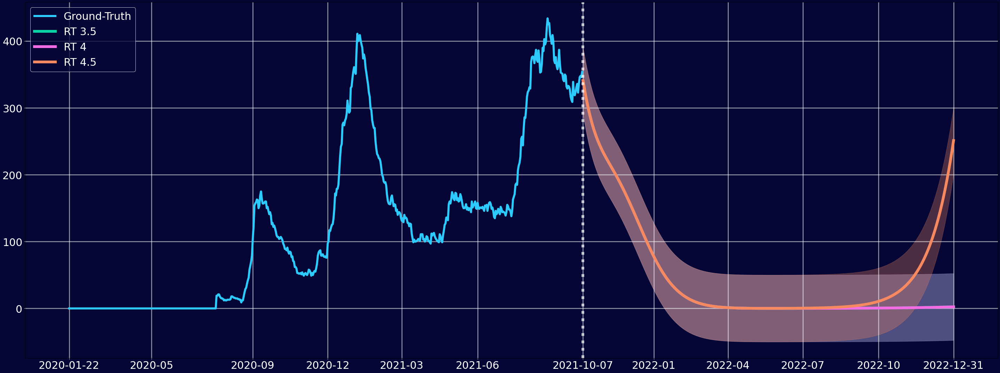

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

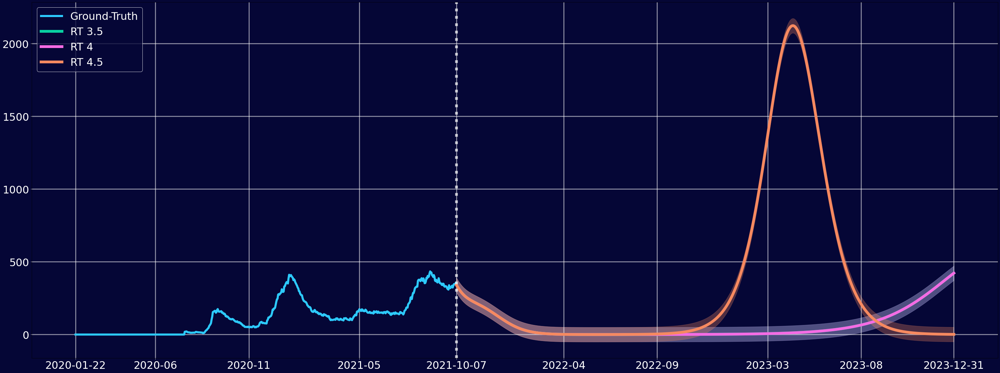

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/anaconda3/envs/heytrt3.7/lib/python3.6/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

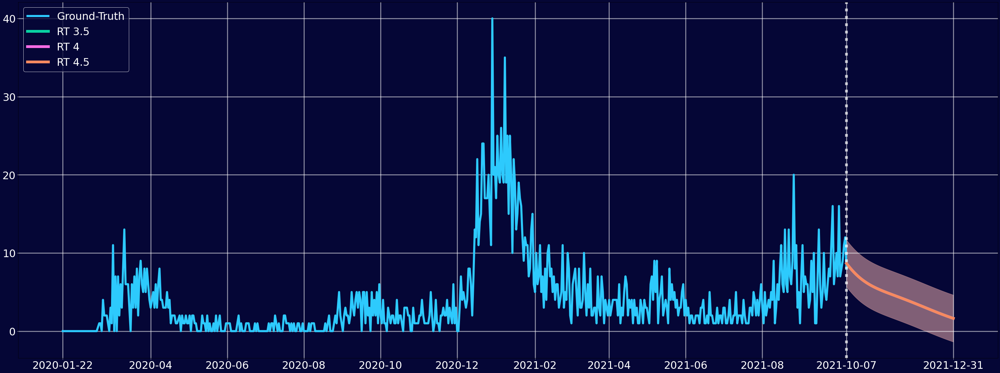

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/anaconda3/envs/heytrt3.7/lib/python3.6/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

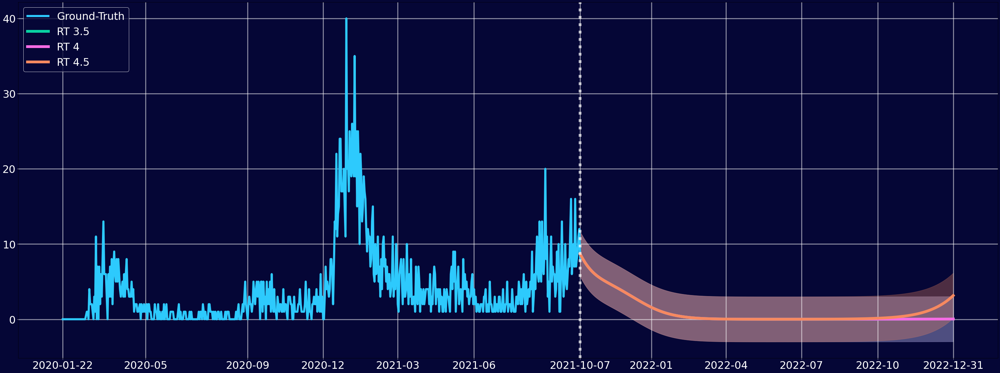

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/anaconda3/envs/heytrt3.7/lib/python3.6/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

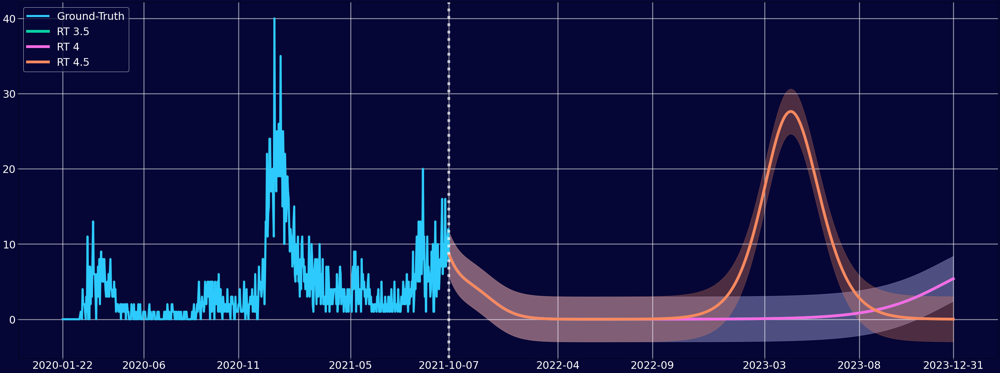

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

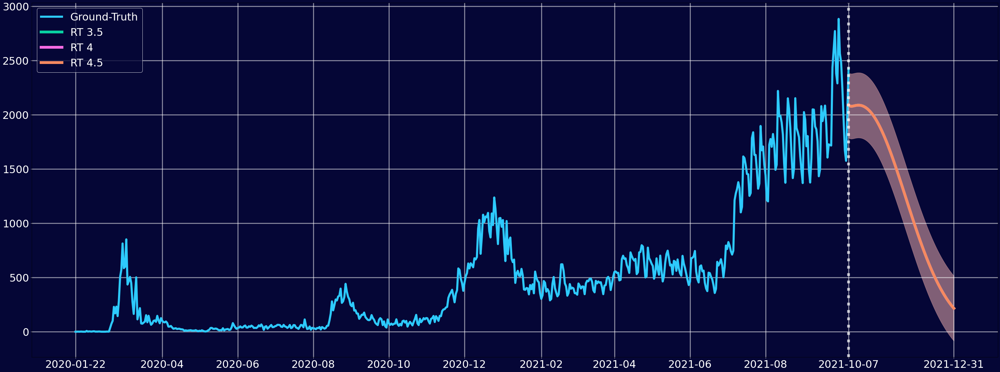

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

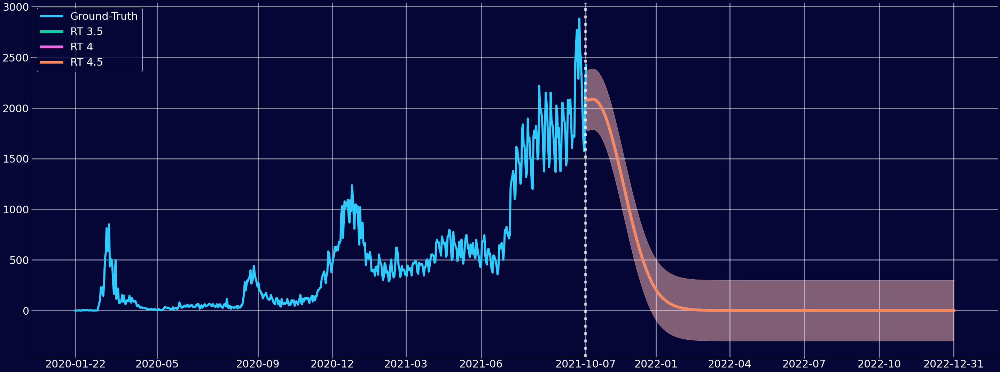

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

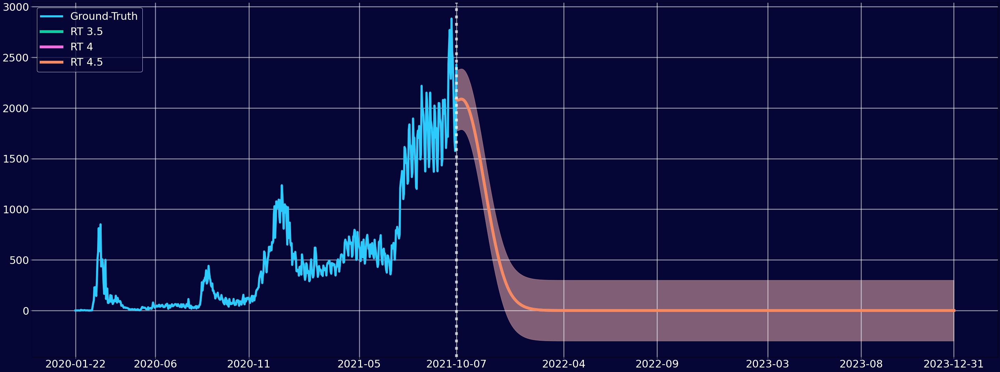

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

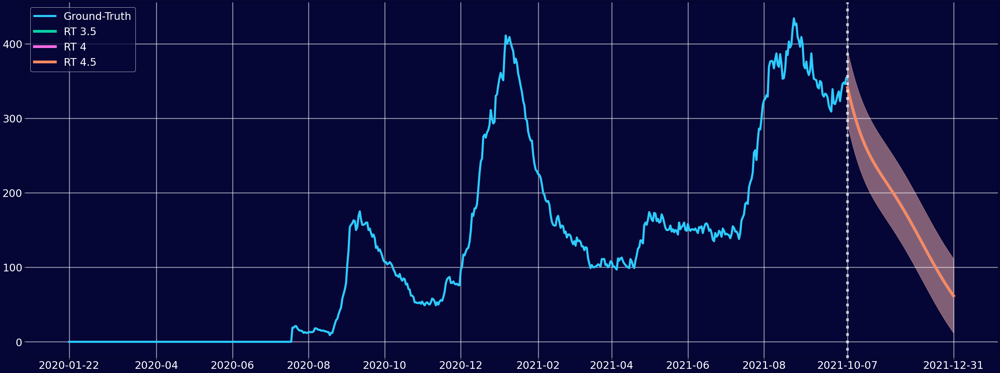

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

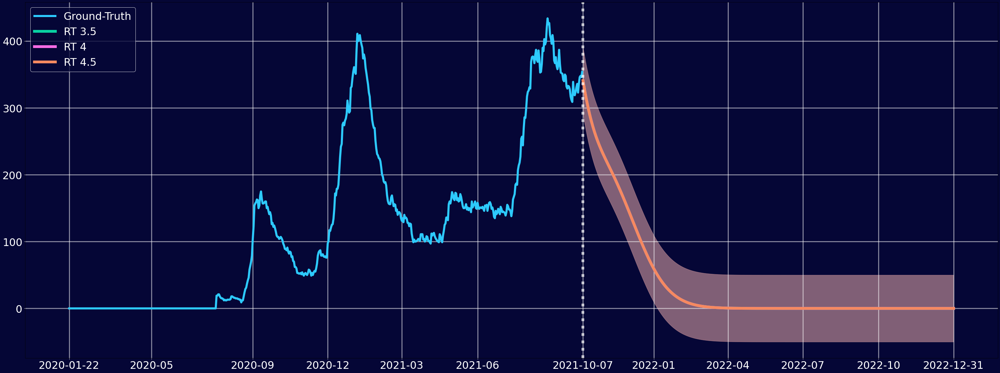

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

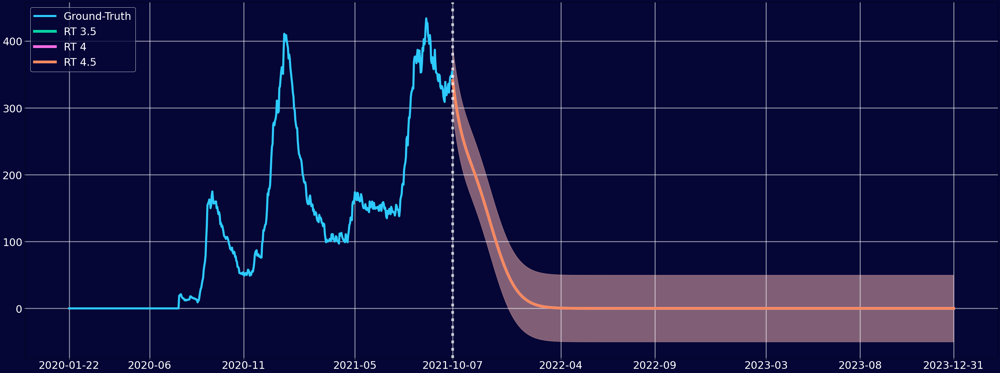

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/anaconda3/envs/heytrt3.7/lib/python3.6/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

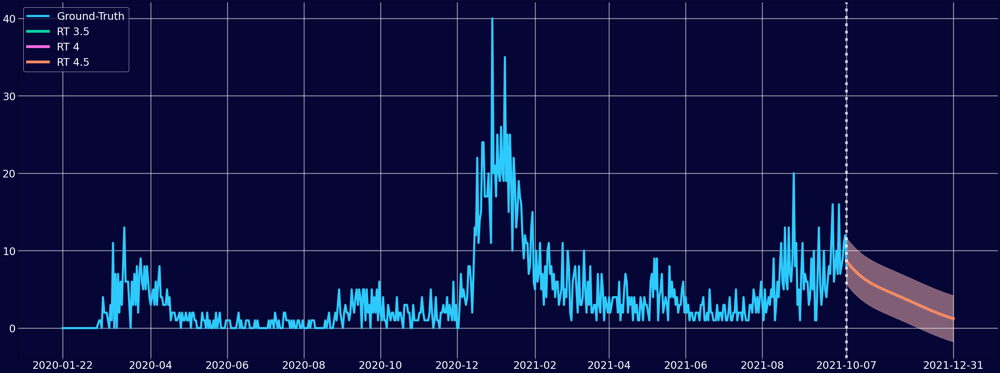

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/anaconda3/envs/heytrt3.7/lib/python3.6/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

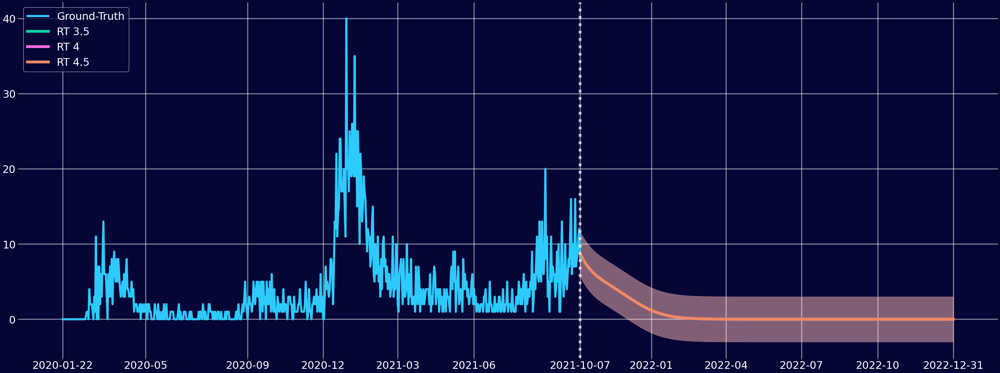

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/anaconda3/envs/heytrt3.7/lib/python3.6/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

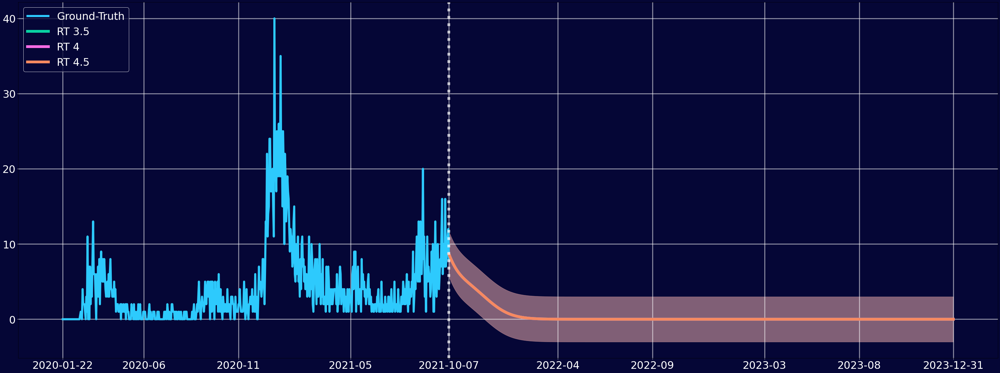

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

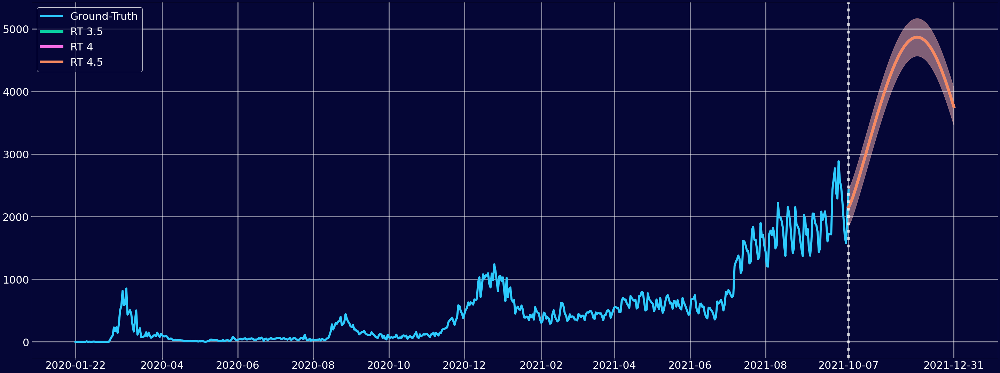

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

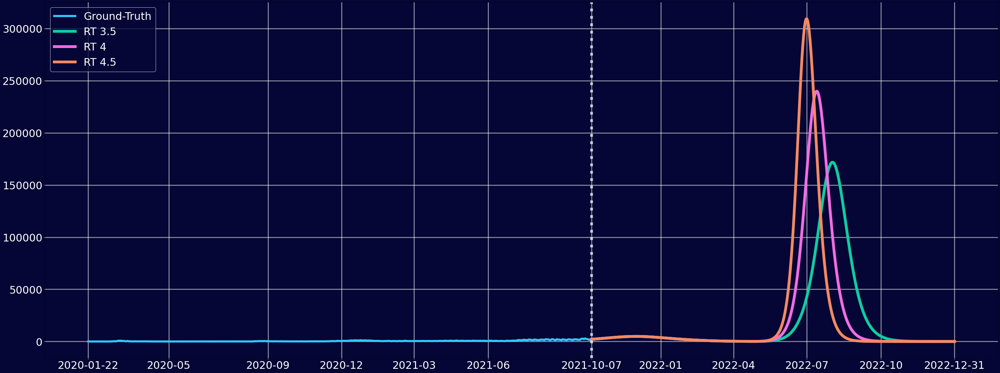

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

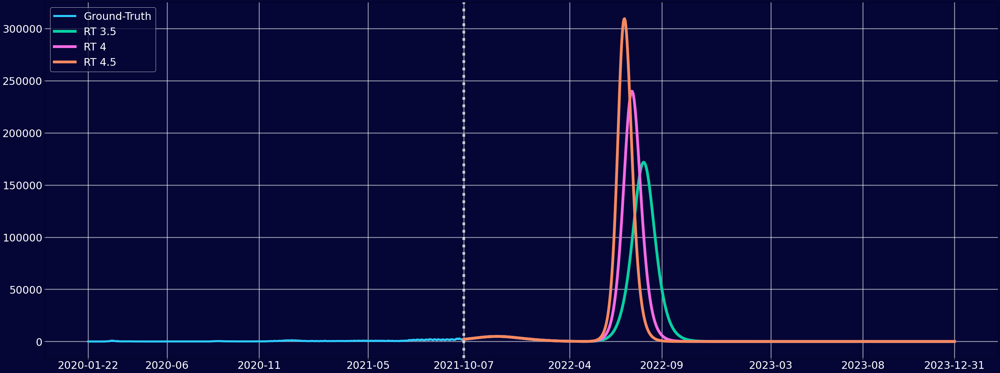

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

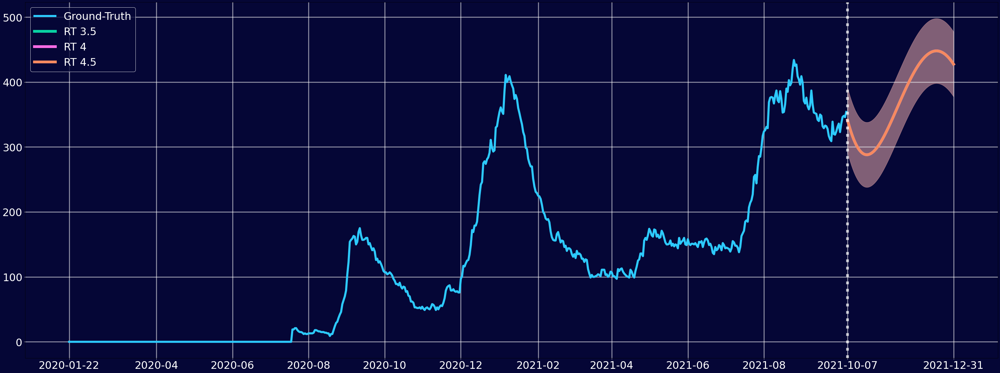

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

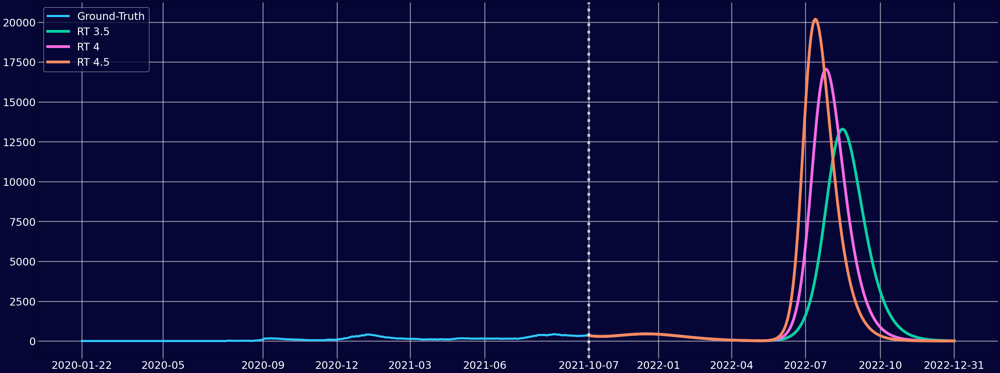

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

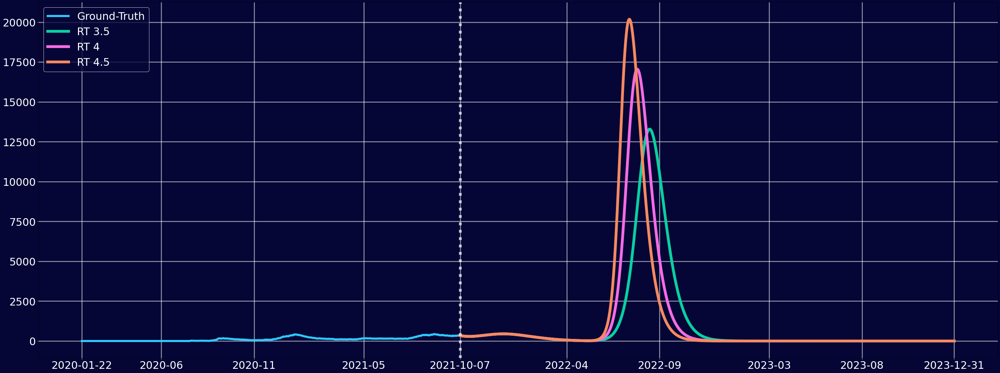

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/anaconda3/envs/heytrt3.7/lib/python3.6/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

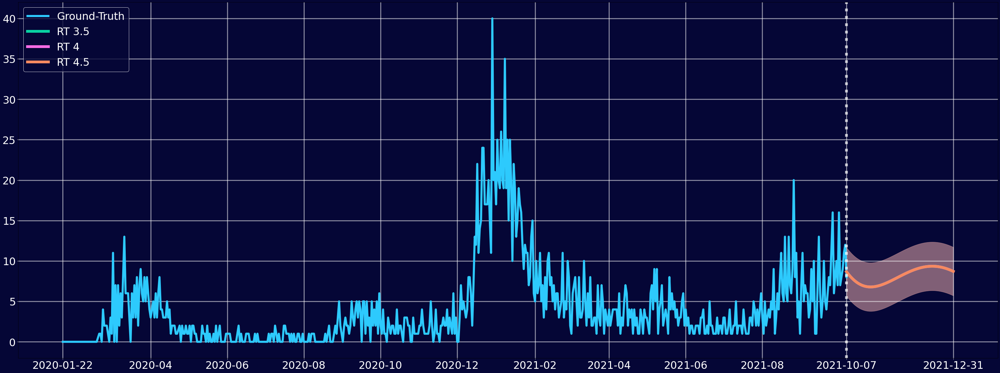

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/anaconda3/envs/heytrt3.7/lib/python3.6/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

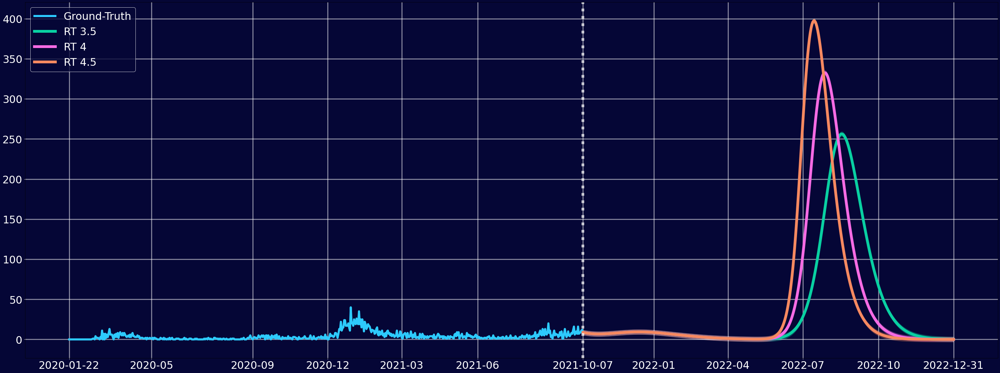

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/anaconda3/envs/heytrt3.7/lib/python3.6/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

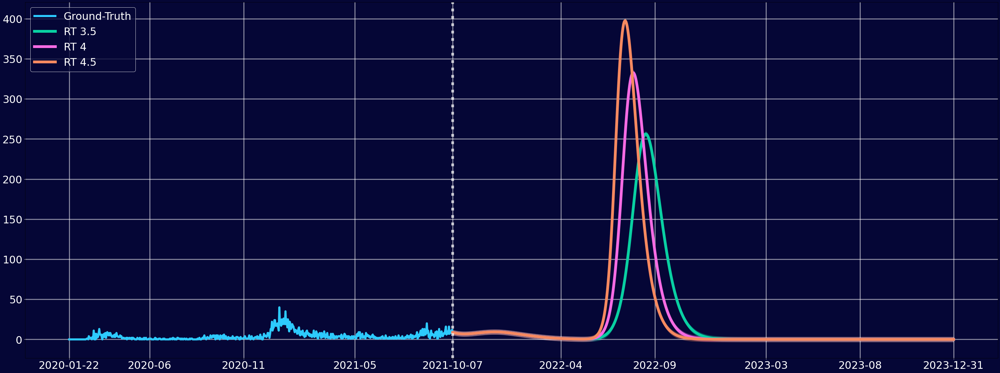

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

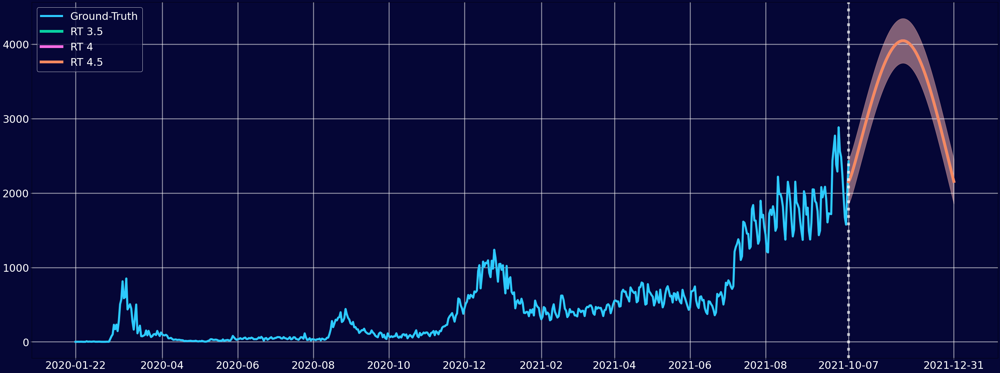

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

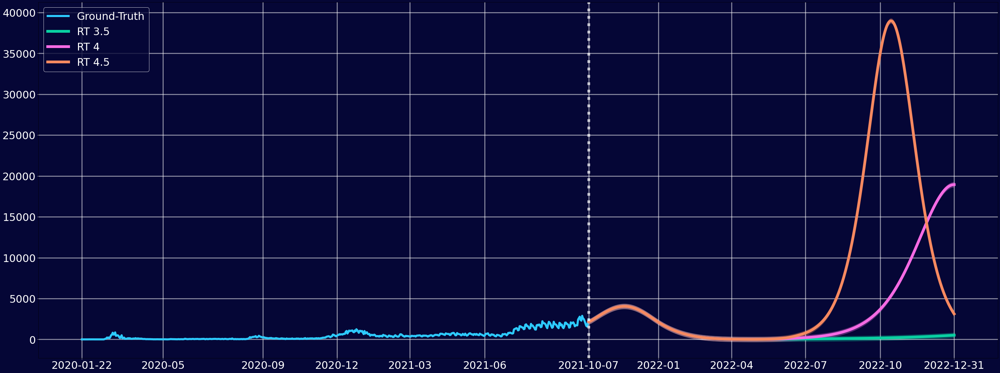

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

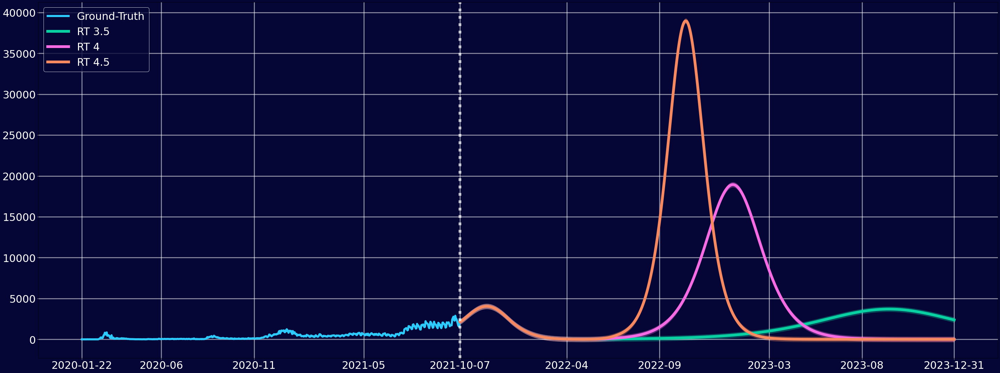

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

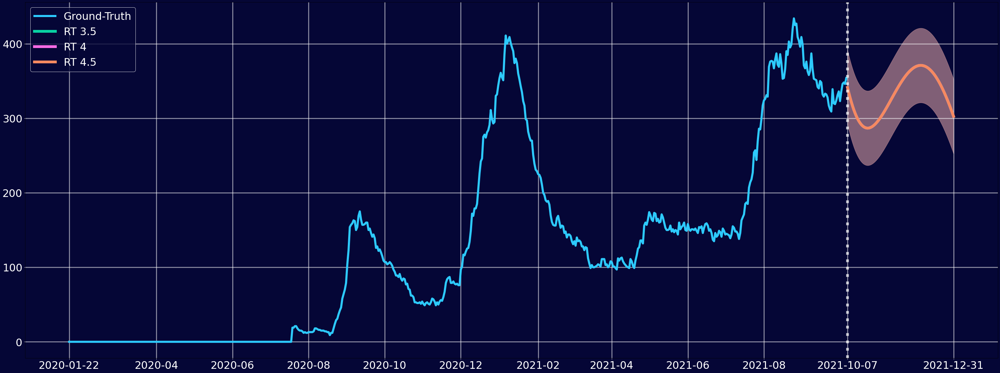

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

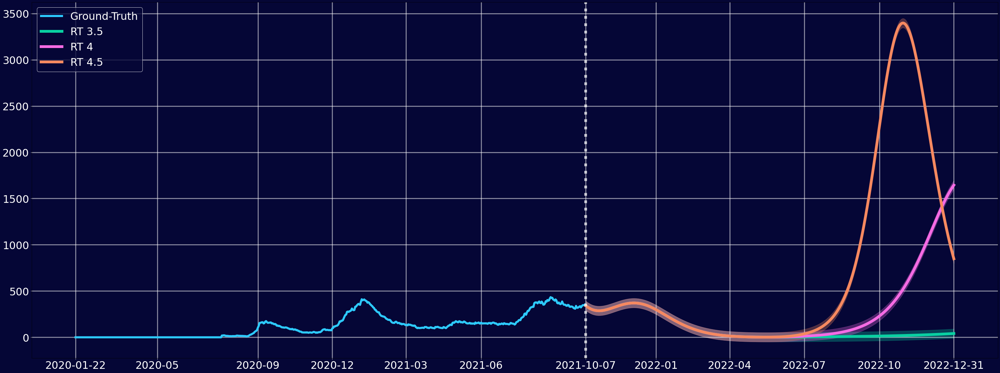

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

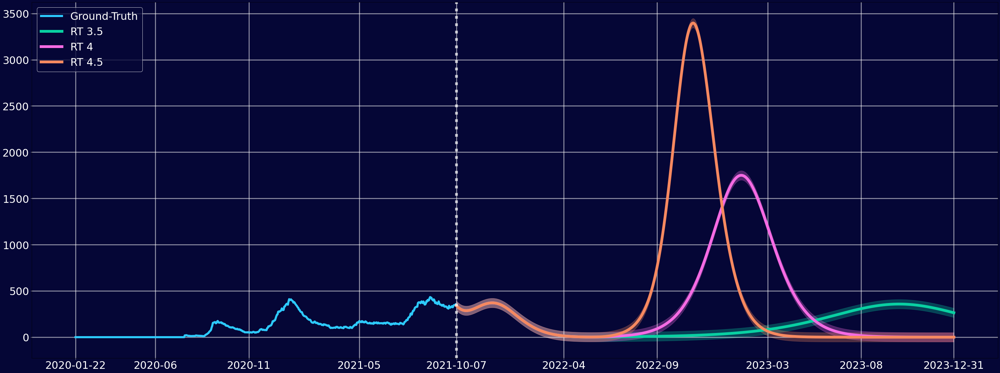

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/anaconda3/envs/heytrt3.7/lib/python3.6/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

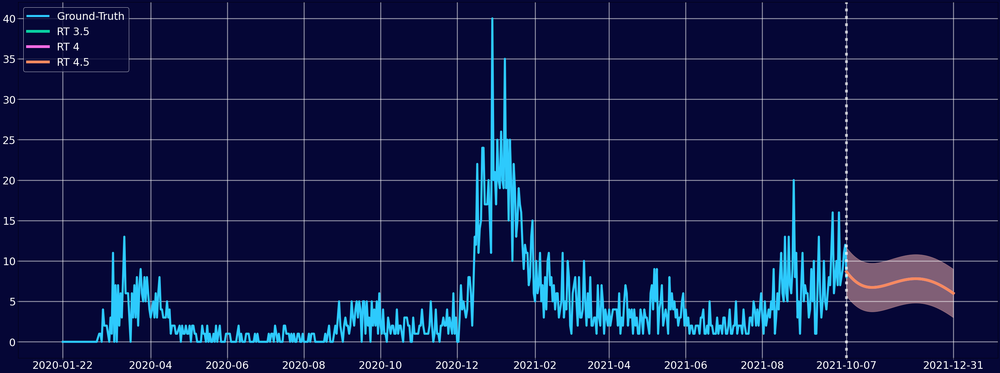

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/anaconda3/envs/heytrt3.7/lib/python3.6/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

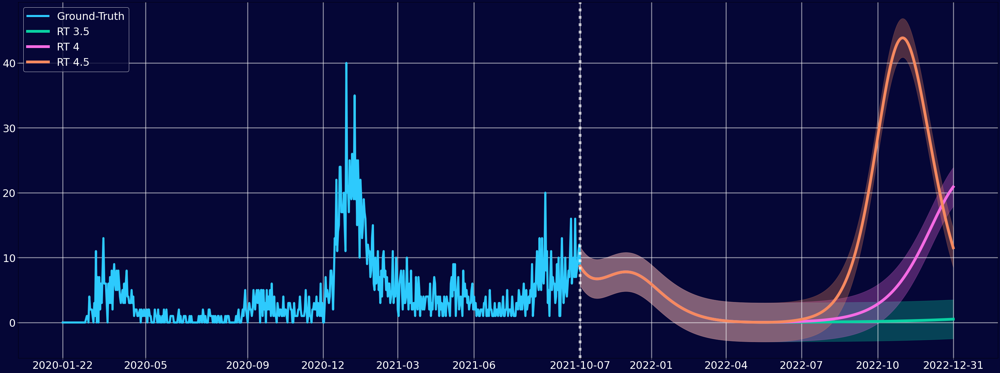

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/anaconda3/envs/heytrt3.7/lib/python3.6/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

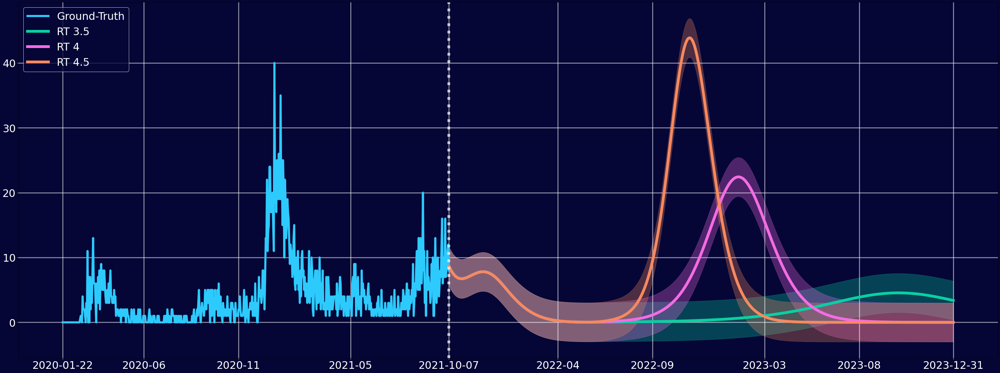

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

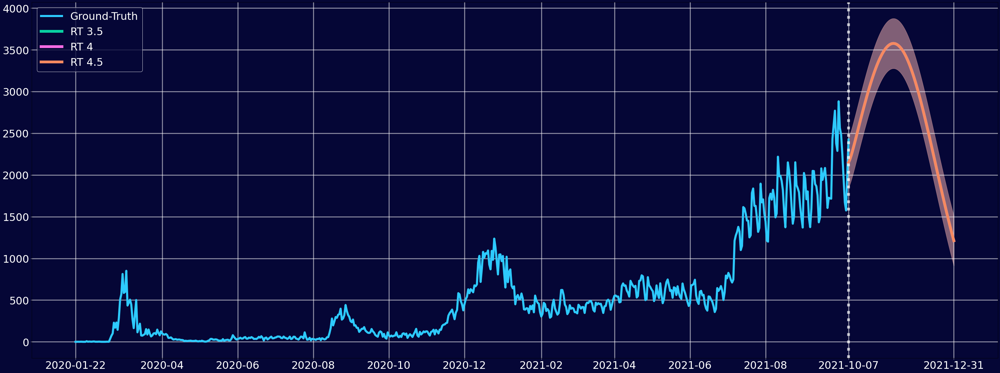

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

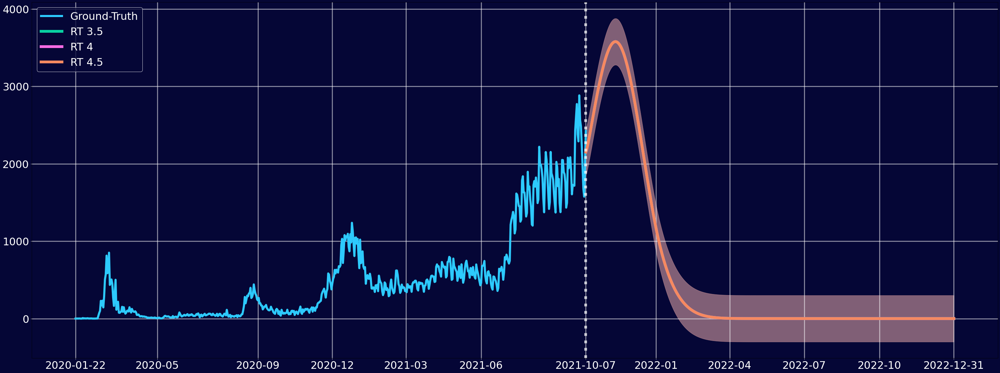

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

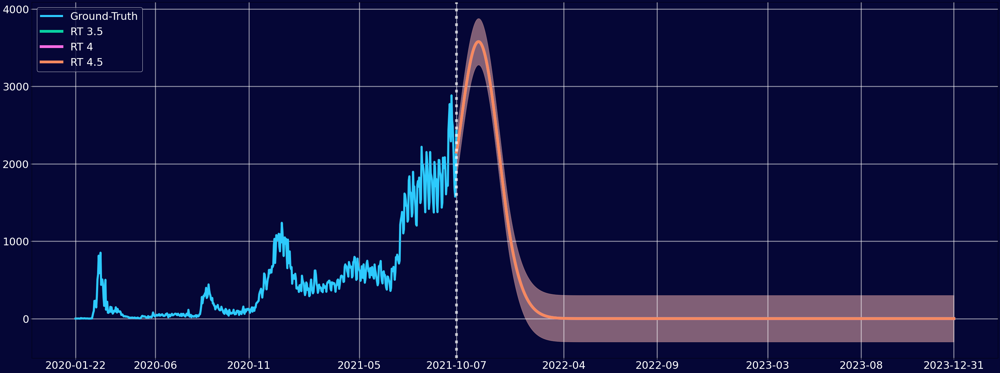

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

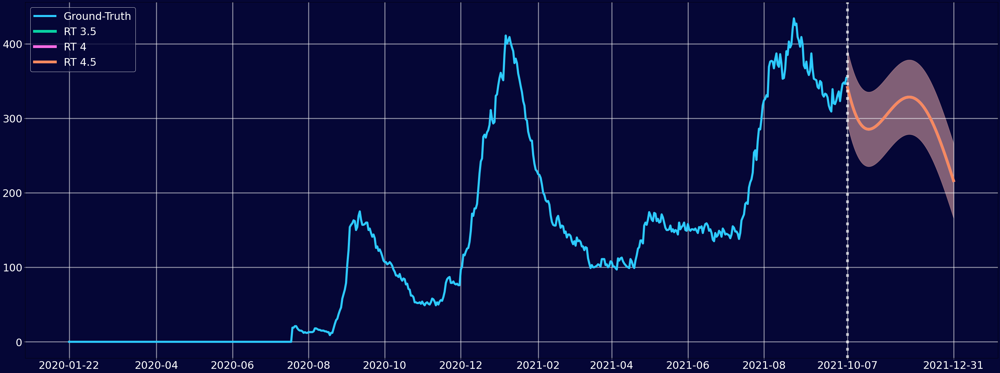

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

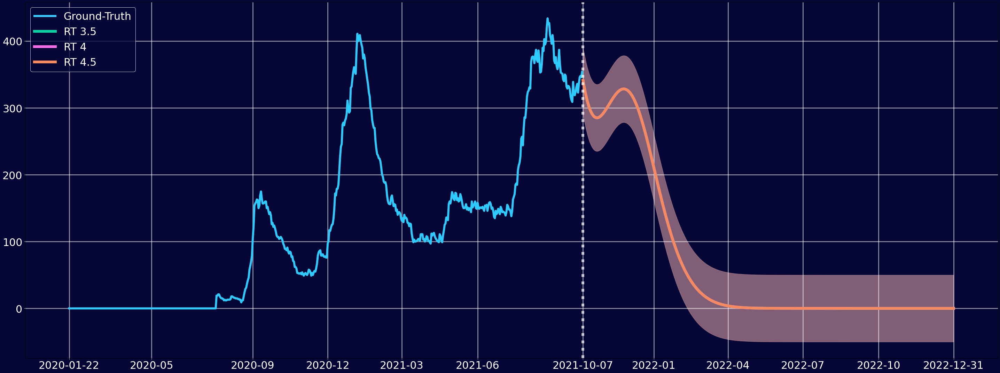

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

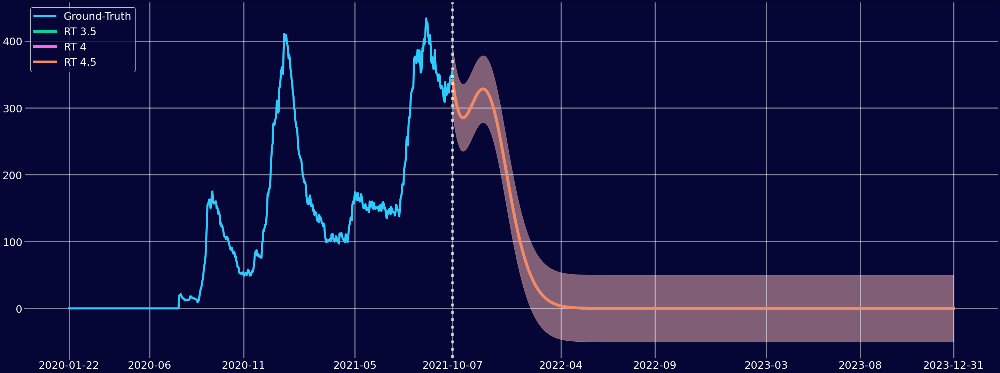

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/anaconda3/envs/heytrt3.7/lib/python3.6/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

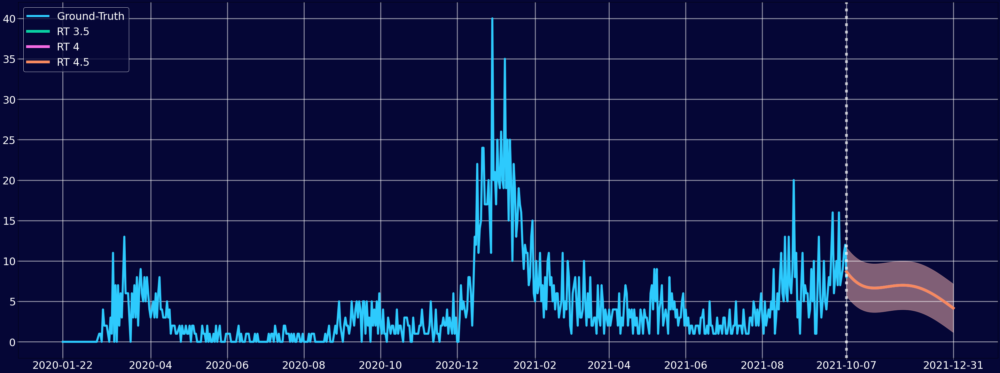

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/anaconda3/envs/heytrt3.7/lib/python3.6/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

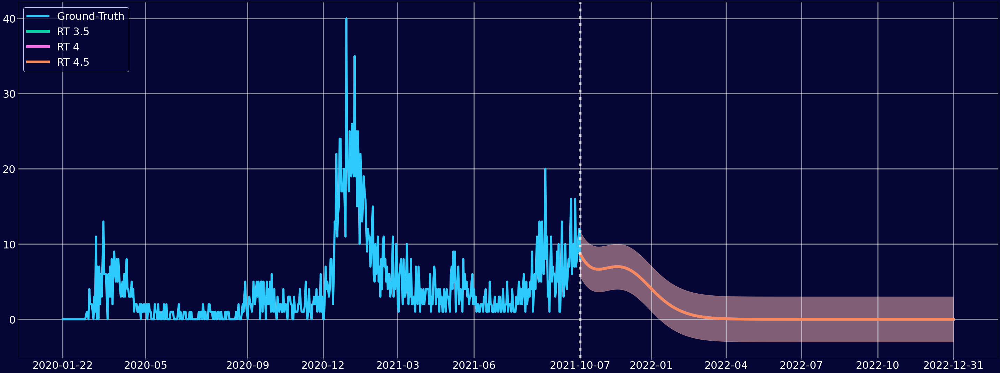

/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sysadm/anaconda3/envs/heytrt3.7/lib/python3.6/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

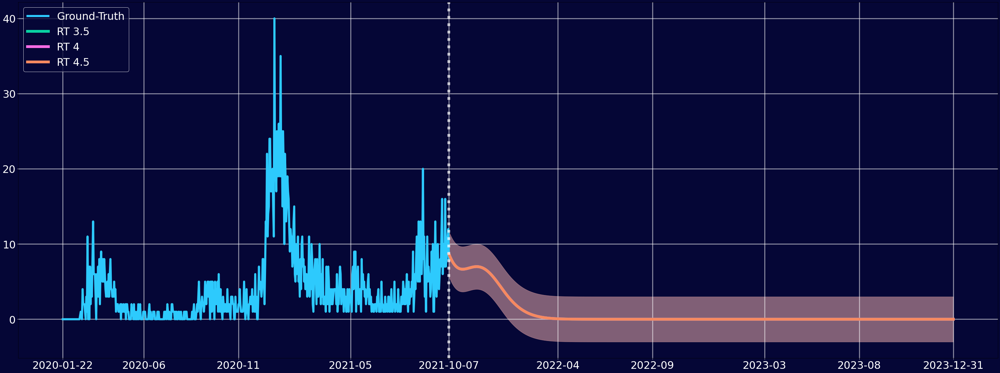

In [24]:
for n in npi:
    if n == npi[0]:      # npi값이 작을수록 값이 높게나옴
        file_name_n1 = 'Base'
    elif n == npi[1]:   # 2 weeks
        file_name_n1 = 'Low'
#     elif n == npi[2]:   # 4 weeks
#         file_name_n1 = 'n_High'
    for v in vac:
        if v == vac[1]:      # base
            file_name_vac = 'Base'
#             y_lim = [-300,13000]
        elif v == vac[0]:   # low
            file_name_vac = 'Low'
#             y_lim = [-300,100000]
        elif v == vac[2]:   # high
            file_name_vac = 'High'
#             y_lim = [-300,4000]
#         for n2 in npi2:
#             if n2 == npi2[1]:      # base
#                 file_name_n2 = 'n2_Base'
#             elif n2 == npi2[0]:   # low
#                 file_name_n2 = 'n2_Low'
# #             elif n2 == npi2[2]:   # high
# #                 file_name_n2 = 'n2_High'
        for t in test:
            if t == test[1]:      # base
                file_name_test = 'Base'
            elif t == test[0]:   # low
                file_name_test = 'Low'
            elif t == test[2]:   # high
                file_name_test = 'High'
            
            file_name = '_'+file_name_vac+"_43_"+file_name_n1
            rt_tp_data = tp_data.loc[(tp_data['NPI']==n)&(tp_data['VACCINE_']==v)&(tp_data['TEST_']==t)]
            rt_s_d_data = s_d_data.loc[(s_d_data['NPI']==n)&(s_d_data['VACCINE_']==v)&(tp_data['TEST_']==t)]
            if t == test[1]:
                TP_Plot_21(rt_tp_data,'RT',file_name,rt)
                TP_Plot_22(rt_tp_data,'RT',file_name,rt)
                TP_Plot_23(rt_tp_data,'RT',file_name,rt)

                S_Plot_21(rt_s_d_data,'RT',file_name,rt)
                S_Plot_22(rt_s_d_data,'RT',file_name,rt)
                S_Plot_23(rt_s_d_data,'RT',file_name,rt)

                D_Plot_21(rt_s_d_data,'RT',file_name,rt)
                D_Plot_22(rt_s_d_data,'RT',file_name,rt)
                D_Plot_23(rt_s_d_data,'RT',file_name,rt)

